In [1]:
import torch
import numpy as np
import pandas as pd
import anndata as ad
import multiDGD
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os
import gc
#import statsmodels.api as sm
#from statsmodels.genmod.families import NegativeBinomial
#import multiprocessing as mp

os.chdir('../..')
os.getcwd()

'/home/vschuste/projects/interpreting_omics_models'

In [2]:
# set all random seeds to 0
torch.manual_seed(0)
np.random.seed(0)
import random
random.seed(0)

In [3]:
# load models and data
# look at relationship between gene hits and mean expression

data_dir = '/home/vschuste/data/singlecell/'
data = ad.read_h5ad(data_dir+'human_bonemarrow.h5ad')

modality_switch = len(data.var[data.var['modality'] == 'GEX'])

model = multiDGD.DGD.load(data=data, save_dir='./03_results/models/', model_name='human_bonemarrow_l20_h2-3_test50e')
with torch.no_grad():
    dispersion_factors = (torch.exp(model.decoder.out_modules[0].distribution.log_r).detach().cpu().numpy() + 1).flatten()
data = data[data.obs['train_val_test'] == 'train']

Covariate model initialized as:

        Gaussian_mix_compture:
            Dimensionality: 2
            Number of components: 4
        
#######################
Training status
#######################
True


/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/multiDGD/_dgd.py:393: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(self._sa

In [4]:
activations = torch.load('03_results/reports/sae_model_10000_l1-1e-3_lr-1e-4_500epochs_activations.pt')

# all active features
active_features = (torch.where(torch.sum(activations, dim=0) != 0)[0]).tolist()

/tmp/ipykernel_1595248/2432187273.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  activations = torch.load('03_results/reports/sae_model_10000_l1-1e-3_lr-1e-4_500epochs_

### RNA

In [18]:
# look at the dataframe with GO term analysis

go_df = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis.csv')
go_df['go type'] = 'biological process'
go_df2 = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_large.csv')
go_df2['go type'] = 'biological process'
go_df3 = pd.read_csv('03_results/reports/sc_dgd_sae_go_analysis_molecular_function.csv')
go_df3['go type'] = 'molecular function'
go_df = pd.concat([go_df, go_df2, go_df3], axis=0, ignore_index=True)

In [19]:
# how many unique GO terms in go_df3?
go_df3['go_id'].nunique()

382

In [6]:
# number of unique features
print('Number of unique features:', len(go_df['feature'].unique()))
print('That is {:.2f}% of all active features'.format(len(go_df['feature'].unique())/len(active_features)*100))

Number of unique features: 4348
That is 81.76% of all active features


### get local and global features and corresponding cell types

In [7]:
# go through all cell types and compute each features mean activation and std for ct positive and negative
cell_types = [x for x in data.obs['cell_type'].unique()]
means_positive = torch.zeros((len(cell_types), activations.shape[1]))
se_positive = torch.zeros((len(cell_types), activations.shape[1]))
means_negative = torch.zeros((len(cell_types), activations.shape[1]))
se_negative = torch.zeros((len(cell_types), activations.shape[1]))
for i, ct in enumerate(cell_types):
    data_indices = data.obs['cell_type'] == ct
    activations_pos = activations[data_indices,:]
    activations_neg = activations[~data_indices,:]
    means_positive[i,:] = torch.mean(activations_pos, dim=0).detach().cpu()
    # compute the standard error of the mean
    se_positive[i,:] = torch.std(activations_pos, dim=0).detach().cpu() / math.sqrt(activations_pos.shape[0])
    means_negative[i,:] = torch.mean(activations_neg, dim=0).detach().cpu()
    se_negative[i,:] = torch.std(activations_neg, dim=0).detach().cpu() / math.sqrt(activations_neg.shape[0])
# that gives the "significant features" per cell type
significant_features = torch.BoolTensor((means_positive - means_negative) > 1.96*(se_positive + se_negative))
sum_significant_features = torch.sum(significant_features, dim=0)

###
# unique (local) vs shared (global) features, and there is a thing in the middle which I call regional
###
# all active features
active_features = (torch.where(torch.sum(activations, dim=0) != 0)[0]).tolist()
# local features are the ct specific ones
local_features = (torch.where(sum_significant_features == 1)[0]).tolist()
regional_features = (torch.where(sum_significant_features > 1)[0]).tolist()
# all remaining active features are global
global_features = list(set(active_features).difference(set(local_features)))
print('{} active features, {} local features, {} global features'.format(len(active_features), len(local_features), len(global_features)))

5318 active features, 908 local features, 4410 global features


In [8]:
# go through them by celltype

unique_ct_features = {}
unique_ct_feature_indices = torch.where(sum_significant_features == 1)[0]
for i, ct in enumerate(cell_types):
    ct_features_temp = torch.where(significant_features[i,:])[0]
    # get the intersection with the unique features
    intersect_feats = list(set(list(ct_features_temp.numpy())).intersection(set(list(unique_ct_feature_indices.numpy()))))
    unique_ct_features[ct] = intersect_feats
    print('Cell type: {}, # unique features: {}'.format(ct, len(intersect_feats)))

Cell type: Naive CD20+ B, # unique features: 15
Cell type: CD14+ Mono, # unique features: 118
Cell type: CD8+ T, # unique features: 12
Cell type: CD16+ Mono, # unique features: 128
Cell type: B1 B, # unique features: 35
Cell type: Lymph prog, # unique features: 23
Cell type: CD4+ T naive, # unique features: 13
Cell type: CD4+ T activated, # unique features: 11
Cell type: Erythroblast, # unique features: 123
Cell type: Normoblast, # unique features: 141
Cell type: NK, # unique features: 4
Cell type: ILC, # unique features: 19
Cell type: Transitional B, # unique features: 25
Cell type: G/M prog, # unique features: 31
Cell type: MK/E prog, # unique features: 0
Cell type: HSC, # unique features: 21
Cell type: pDC, # unique features: 19
Cell type: ID2-hi myeloid prog, # unique features: 28
Cell type: Proerythroblast, # unique features: 104
Cell type: Plasma cell, # unique features: 8
Cell type: cDC2, # unique features: 28
Cell type: CD8+ T naive, # unique features: 2


/tmp/ipykernel_1595248/3971213035.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, horizontalalignment='center')


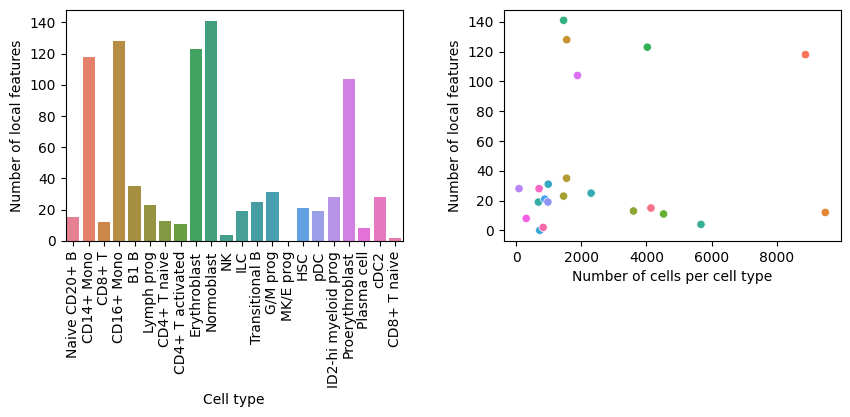

In [9]:
# plot a histogram of the number of unique features per cell type

# get the number of cells per cell type
cells_per_ct = data.obs['cell_type'].value_counts()
cells_per_ct = cells_per_ct[cell_types]
n_unique_features_per_ct = [len(unique_ct_features[ct]) for ct in cell_types]

fig, ax = plt.subplots(1, 2, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.3)
sns.barplot(x=cell_types, y=n_unique_features_per_ct, ax=ax[0], hue=cell_types)
ax[0].set_xlabel('Cell type')
ax[0].set_ylabel('Number of local features')
# rotate the x-axis labels
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, horizontalalignment='center')
sns.scatterplot(x=cells_per_ct, y=n_unique_features_per_ct, hue=cell_types, ax=ax[1])
ax[1].set_xlabel('Number of cells per cell type')
ax[1].set_ylabel('Number of local features')
ax[1].legend(title='Cell type', bbox_to_anchor=(1.05, 1), loc='upper left').set_visible(False)
plt.show()

In [20]:
go_df_feat_types = []
go_df_celltypes = []

for i in range(len(go_df)):
    feat = go_df['feature'][i]
    if feat in local_features:
        go_df_feat_types.append('local')
        # get which celltype it is unique to
        for ct in cell_types:
            if feat in unique_ct_features[ct]:
                go_df_celltypes.append(ct)
                break
    elif feat in global_features:
        go_df_feat_types.append('global')
        go_df_celltypes.append('')
    else:
        go_df_feat_types.append('')
        go_df_celltypes.append('')

go_df['feature_type'] = go_df_feat_types
go_df['celltype'] = go_df_celltypes

In [21]:
go_df.head()

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,go_name,go_level,feature,p_threshold,fold_change_threshold,go type,feature_type,celltype
0,1,0.001787,0.001786,+,559.625000,0.5,-2.020111,0.021686,0.331576,GO:0007187,"G protein-coupled receptor signaling pathway, ...",4,8192,0.00001,2.0,biological process,global,
1,1,0.004169,0.004165,+,239.839286,0.5,-2.048834,0.020239,0.388106,GO:0043087,regulation of GTPase activity,5,8192,0.00001,2.0,biological process,global,
2,1,0.008488,0.008470,+,117.815789,0.5,-2.173695,0.014864,0.416707,GO:0007204,positive regulation of cytosolic calcium ion c...,3,8192,0.00001,2.0,biological process,global,
3,1,0.009530,0.009507,+,104.929688,0.5,-2.367738,0.008949,0.414354,GO:0007268,chemical synaptic transmission,7,8192,0.00001,2.0,biological process,global,
4,1,0.009828,0.009804,+,101.750000,0.5,-2.745577,0.003020,0.402196,GO:0019722,calcium-mediated signaling,5,8192,0.00001,2.0,biological process,global,


In [15]:
# plot a density plot of mean vs max activations colored by global and local features
# get the mean and max activations
mean_activations = torch.mean(activations, dim=0).detach().cpu().numpy()
max_activations = torch.max(activations, dim=0)[0].detach().cpu().numpy()
nonzero_activations = torch.sum(activations != 0, dim=0).detach().cpu().numpy()
# get the feature types
feature_types = []
for i in range(activations.shape[1]):
    if i in local_features:
        feature_types.append('local')
    elif i in global_features:
        feature_types.append('global')
    else:
        feature_types.append('dead')

activ_df = pd.DataFrame({'mean': mean_activations, 'max': max_activations, 'feature type': feature_types, 'nonzero': nonzero_activations})

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


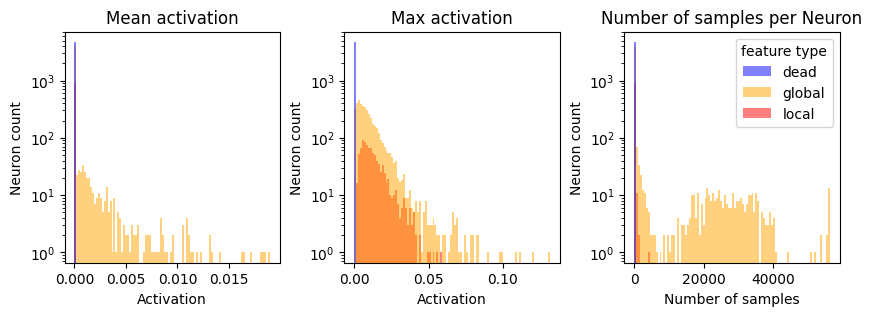

In [17]:
# make a plot with 2 histplots for mean and max
fig, ax = plt.subplots(1, 3, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.3)
sns.histplot(activ_df, x='mean', ax=ax[0], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[0].set_yscale('log')
ax[0].set_xlabel('Activation')
ax[0].set_ylabel('Neuron count')
ax[0].set_title('Mean activation')
ax[0].legend().remove()
sns.histplot(activ_df, x='max', ax=ax[1], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[1].set_yscale('log')
ax[1].set_xlabel('Activation')
ax[1].set_ylabel('Neuron count')
ax[1].set_title('Max activation')
ax[1].legend().remove()
sns.histplot(activ_df, x='nonzero', ax=ax[2], bins=100, linewidth=0, hue='feature type', palette=['blue', 'orange', 'red'])
ax[2].set_yscale('log')
ax[2].set_xlabel('Number of samples')
ax[2].set_ylabel('Neuron count')
ax[2].set_title('Number of samples per Neuron')
plt.show()

In [19]:
min(activ_df[activ_df['feature type'] == 'local']['nonzero']), max(activ_df[activ_df['feature type'] == 'local']['nonzero'])

(5, 4297)

In [20]:
min(activ_df[activ_df['feature type'] == 'global']['nonzero']), max(activ_df[activ_df['feature type'] == 'global']['nonzero'])

(1, 56308)

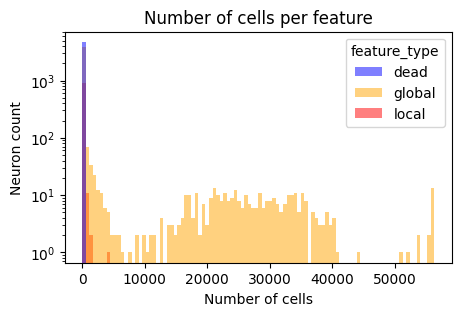

In [9]:
# plot the number of cells per feature

fig, ax = plt.subplots(1, 1, figsize=(5, 3))
sns.histplot(activ_df, x='nonzero', ax=ax, bins=100, linewidth=0, hue='feature_type', palette=['blue', 'orange', 'red'])
ax.set_yscale('log')
ax.set_xlabel('Number of cells')
ax.set_ylabel('Neuron count')
ax.set_title('Number of cells per feature')
plt.show()

### checks of left out features:

There seems to be no systematic bias in the left out features, at least not wrt to number of zeros or average activation (apart from the dead ones we left out).

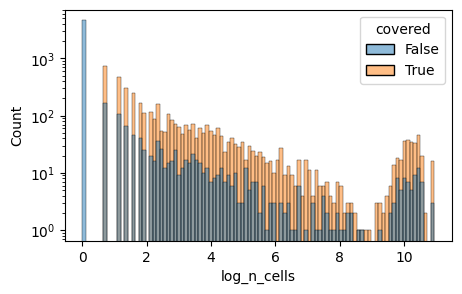

In [12]:
# plot a histogram of covered vs non covered features wrt the number of cells

n_zeros_per_feature = (activations == 0).sum(dim=0)
temp_df = pd.DataFrame({
    'n_cells': (activations.shape[0] - n_zeros_per_feature).numpy(),
    'covered': [x in go_df['feature'].unique() for x in range(activations.shape[1])]
})

fig, ax = plt.subplots(1, 1, figsize=(5, 3))
# create logwise bins
temp_df['log_n_cells'] = np.log1p(temp_df['n_cells'])
sns.histplot(data=temp_df, x='log_n_cells', hue='covered', bins=100, ax=ax)
#sns.histplot(data=temp_df, x='n_cells', hue='covered', bins=100, ax=ax)
ax.set_yscale('log')
#ax.set_xscale('log')
plt.show()

### Unique GO terms

In [16]:
# count how often each unique go term appears in the b1b features
print(go_df['go_name'].value_counts())

DNA replication initiation                                1532
heme biosynthetic process                                 1450
cell division                                             1411
homologous chromosome pairing at meiosis                  1410
regulation of DNA-templated DNA replication initiation    1326
                                                          ... 
positive regulation of interleukin-12 production             1
endosome to lysosome transport                               1
dolichol-linked oligosaccharide biosynthetic process         1
negative regulation of gene expression, epigenetic           1
transcription regulator inhibitor activity                   1
Name: go_name, Length: 1461, dtype: int64


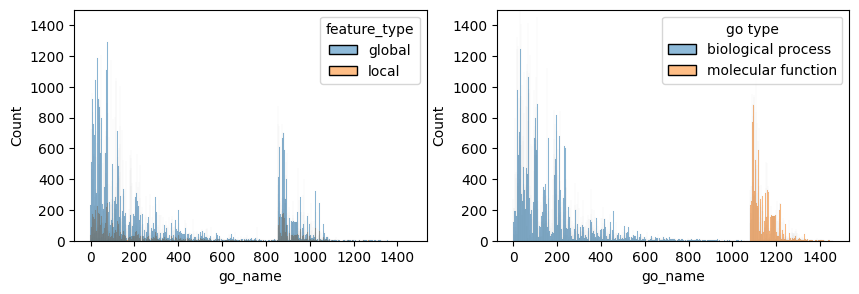

In [35]:
# make a histogram

# give every go term an index
go_ids = go_df['go_id'].unique()
go_id_dict = {go_ids[i]: i for i in range(len(go_ids))}
go_df['go_idx'] = go_df['go_id'].map(go_id_dict)
# make a dataframe with the idx and count
go_counts = go_df['go_idx'].value_counts().reset_index()

fig, ax = plt.subplots(1, 2, figsize=(10, 3))
# add spacing
fig.subplots_adjust(wspace=0.2)
sns.histplot(data=go_df.sort_values('feature_type'), x='go_name', hue='feature_type', ax=ax[0], alpha=0.5)
ax[0].set_xticks(range(0, len(go_ids), 200))
ax[0].set_xticklabels(range(0, len(go_ids), 200))
ax[0].set_ylim(0, 1500)
sns.histplot(data=go_df, x='go_name', hue='go type', ax=ax[1])
# set the indices of go_idx as xticks (every 1000)
ax[1].set_ylim(0, 1500)
ax[1].set_xticks(range(0, len(go_ids), 200))
ax[1].set_xticklabels(range(0, len(go_ids), 200))
#plt.xticks([])
plt.show()

### create GO parents

In [36]:
from goatools.obo_parser import GODag
obodag = GODag("01_data/go-basic.obo")

01_data/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms


In [37]:
# for each go term, create a list of all parents
go_terms = go_df['go_id'].unique()
print(len(go_terms))
go_terms_ancestry = {}

for go_term in go_terms:
    go_obj = obodag[go_term]
    level = go_obj.level
    out_parents = []
    out_levels = []
    while level > 1:
        parents = list(go_obj.parents)
        if len(parents) > 1:
            # get the parent with level-1
            for parent in parents:
                if parent.level == level - 1:
                    go_obj = parent
                    break
        else:
            go_obj = parents[0]
        out_parents.append(go_obj.id)
        out_levels.append(go_obj.level)
        level = go_obj.level
    go_terms_ancestry[go_term] = {'parents': out_parents, 'levels': out_levels}

1461


In [38]:
parent_go_ids = []

for go_term in go_terms_ancestry.keys():
    if len(go_terms_ancestry[go_term]['parents']) == 0:
        continue
    last_level = go_terms_ancestry[go_term]['levels'][-1]
    if last_level == 1:
        #print(go_terms_ancestry[go_term]['parents'])
        #print(go_terms_ancestry[go_term]['parents'][-1])
        parent_go_ids.append(go_terms_ancestry[go_term]['parents'][-1])

parent_go_ids = list(set(parent_go_ids))
print('There are {} parent go terms (level 1)'.format(len(parent_go_ids)))

There are 31 parent go terms (level 1)


In [39]:
go_df['parent_go_id_level1'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-1] if len(go_terms_ancestry[x]['parents']) > 0 else x)
go_df['parent_go_name_level1'] = go_df['parent_go_id_level1'].apply(lambda x: obodag[x].name)
#go_df['parent_go_id_level2'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-2] if len(go_terms_ancestry[x]['parents']) > 1 else x if len(go_terms_ancestry[x]['parents']) == 1 else '')
go_df['parent_go_id_level2'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-2] if len(go_terms_ancestry[x]['parents']) > 1 else x)
go_df['parent_go_name_level2'] = go_df['parent_go_id_level2'].apply(lambda x: obodag[x].name if x != '' else '')
#go_df['parent_go_id_level3'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-3] if len(go_terms_ancestry[x]['parents']) > 2 else x if len(go_terms_ancestry[x]['parents']) == 2 else '')
go_df['parent_go_id_level3'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-3] if len(go_terms_ancestry[x]['parents']) > 2 else x)
go_df['parent_go_name_level3'] = go_df['parent_go_id_level3'].apply(lambda x: obodag[x].name if x != '' else '')
#go_df['parent_go_id_level4'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-4] if len(go_terms_ancestry[x]['parents']) > 3 else x if len(go_terms_ancestry[x]['parents']) == 3 else '')
go_df['parent_go_id_level4'] = go_df['go_id'].apply(lambda x: go_terms_ancestry[x]['parents'][-4] if len(go_terms_ancestry[x]['parents']) > 3 else x)
go_df['parent_go_name_level4'] = go_df['parent_go_id_level4'].apply(lambda x: obodag[x].name if x != '' else '')

In [49]:
go_df

,n_hits,expected,binom_pval,binom_direction,binom_fold_change,fdr,z_score,mw_pval,effect_size,go_id,...,celltype,go_idx,parent_go_id_level1,parent_go_name_level1,parent_go_id_level2,parent_go_name_level2,parent_go_id_level3,parent_go_name_level3,parent_go_id_level4,parent_go_name_level4
0,1,0.001787,0.001786,+,559.625000,0.500000,-2.020111,0.021686,0.331576,GO:0007187,...,,0,GO:0009987,cellular process,GO:0007165,signal transduction,GO:0007186,G protein-coupled receptor signaling pathway,GO:0007187,"G protein-coupled receptor signaling pathway, ..."
1,1,0.004169,0.004165,+,239.839286,0.500000,-2.048834,0.020239,0.388106,GO:0043087,...,,1,GO:0065007,biological regulation,GO:0065009,regulation of molecular function,GO:0050790,regulation of catalytic activity,GO:0051336,regulation of hydrolase activity
2,1,0.008488,0.008470,+,117.815789,0.500000,-2.173695,0.014864,0.416707,GO:0007204,...,,2,GO:0065007,biological regulation,GO:0065008,regulation of biological quality,GO:0007204,positive regulation of cytosolic calcium ion c...,GO:0007204,positive regulation of cytosolic calcium ion c...
3,1,0.009530,0.009507,+,104.929688,0.500000,-2.367738,0.008949,0.414354,GO:0007268,...,,3,GO:0009987,cellular process,GO:0007154,cell communication,GO:0007267,cell-cell signaling,GO:0099536,synaptic signaling
4,1,0.009828,0.009804,+,101.750000,0.500000,-2.745577,0.003020,0.402196,GO:0019722,...,,4,GO:0009987,cellular process,GO:0007165,signal transduction,GO:0035556,intracellular signal transduction,GO:0141124,intracellular signaling cassette
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114925,1,0.047502,0.046410,+,21.051724,0.982759,-1.950147,0.025579,0.330186,GO:0099173,...,,269,GO:0009987,cellular process,GO:0071840,cellular component organization or biogenesis,GO:0016043,cellular component organization,GO:0099173,postsynapse organization
114926,3,0.146825,0.000451,+,20.432556,0.948276,-3.967989,0.000036,0.696701,GO:0045454,...,,27,GO:0042592,homeostatic process,GO:0019725,cellular homeostasis,GO:0045454,cell redox homeostasis,GO:0045454,cell redox homeostasis
114927,4,0.211600,0.000064,+,18.903589,0.931034,-3.956655,0.000038,0.663474,GO:0030218,...,,155,GO:0009987,cellular process,GO:0048869,cellular developmental process,GO:0030154,cell differentiation,GO:0030099,myeloid cell differentiation
114928,2,0.116596,0.006199,+,17.153257,0.965517,-3.417550,0.000316,0.690062,GO:0016226,...,,163,GO:0009987,cellular process,GO:0071840,cellular component organization or biogenesis,GO:0016043,cellular component organization,GO:0022607,cellular component assembly


### create the GO-feature matrix

In [40]:
# create a matrix of all go terms and features

go_feature_matrix = torch.zeros((len(go_df['go_name'].unique()), activations.shape[1]))

for i, go_id in enumerate(go_df['go_id'].unique()):
    for feat in go_df[go_df['go_id'] == go_id]['feature']:
        go_feature_matrix[i,feat] = 1

# remove all columns with zero sum (unused features)
mtrx_go_ids = go_df['go_id'].unique()
mtrx_go_names = [obodag[x].name for x in mtrx_go_ids]
mtrx_feature_ids = torch.where(go_feature_matrix.sum(dim=0) > 0)[0]

go_feature_matrix = go_feature_matrix[:,torch.where(go_feature_matrix.sum(dim=0) > 0)[0]]

### create a word cloud of the GO terms

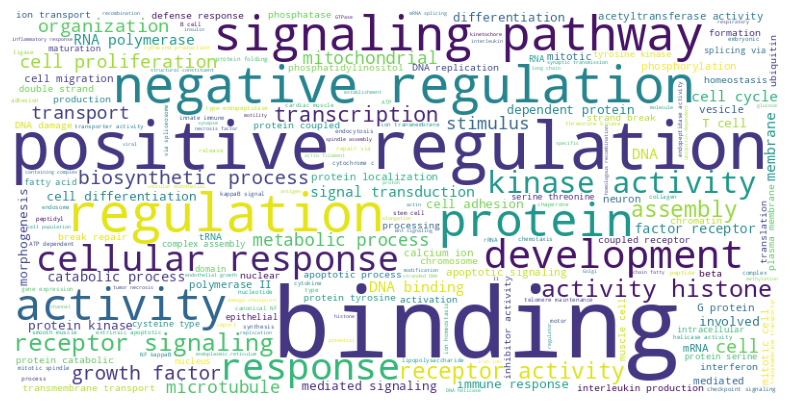

In [41]:
# create a word cloud of the go terms

#!pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(mtrx_go_names))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [43]:
# let chatgpt create a one-sentence summary of a feature's function based on its associated go terms

for feat in go_df['feature'].unique():
    go_ids = go_df[go_df['feature'] == feat]['go_id'].unique()
    go_names = [obodag[x].name for x in go_ids]
    # now promt this to chatgpt
    if feat in [2306, 1238, 5205, 1500]:
        print(feat, go_names)

2306 ['regulation of DNA-templated DNA replication initiation', 'double-strand break repair via break-induced replication', 'DNA unwinding involved in DNA replication', 'cellular response to interleukin-4', 'DNA replication initiation', 'protein insertion into mitochondrial inner membrane', 'mitochondrial electron transport, ubiquinol to cytochrome c', 'homologous chromosome pairing at meiosis', 'fatty acid beta-oxidation using acyl-CoA dehydrogenase', 'positive regulation of protein localization to Cajal body', 'regulation of G2/M transition of mitotic cell cycle', 'cell redox homeostasis', 'DNA replication checkpoint signaling', 'kinetochore assembly', 'response to cadmium ion', 'cellular response to nitric oxide', 'ATP biosynthetic process', 'protein targeting to mitochondrion', 'resolution of meiotic recombination intermediates', 'hydrogen peroxide catabolic process', 'DNA replication', 'proton motive force-driven ATP synthesis', 'chaperone-mediated protein complex assembly', 'posi

### UMAPs

/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/vschuste/miniconda3/envs/sc_mechinterp/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


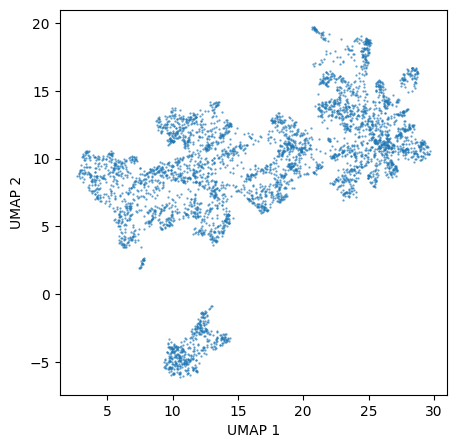

In [44]:
import umap

reducer = umap.UMAP(n_components=2, min_dist=0.6, n_neighbors=20, random_state=0)
embedding = reducer.fit_transform(go_feature_matrix.T)

df_umap = pd.DataFrame(embedding, columns=['UMAP 1', 'UMAP 2'])
df_umap['feature'] = mtrx_feature_ids.numpy()

# plot the UMAP

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None)
plt.show()

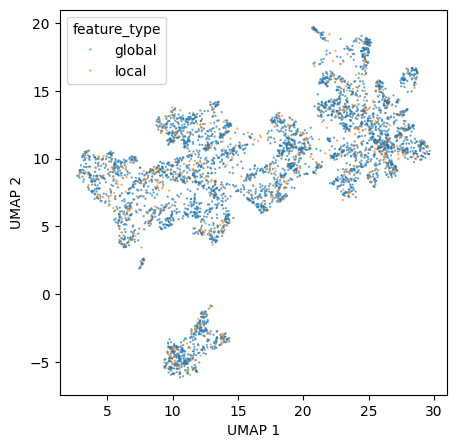

In [45]:
df_umap['feature_type'] = ['local' if x in local_features else 'global' for x in df_umap['feature']]

# plot by feature type
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='feature_type', s=2, alpha=0.7, ec=None)
plt.show()

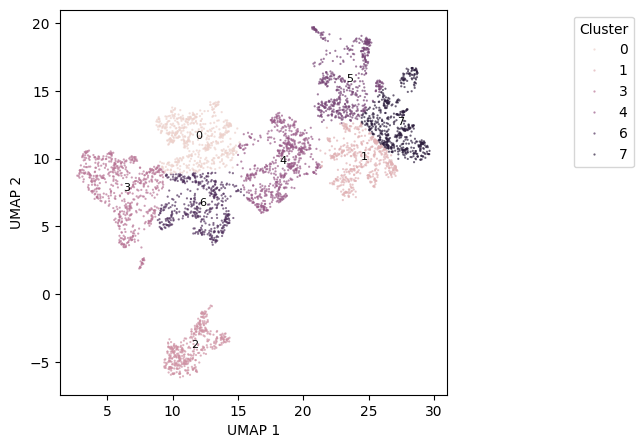

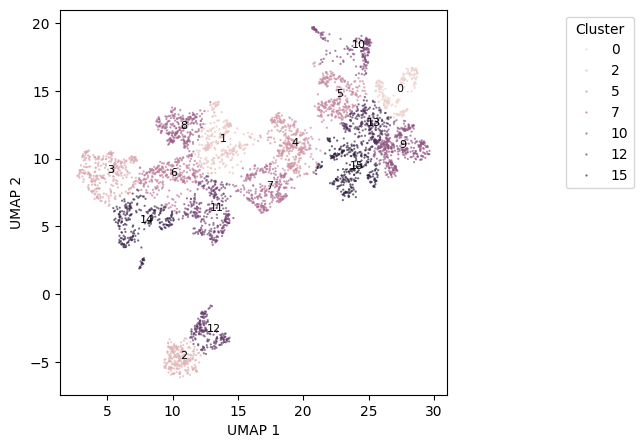

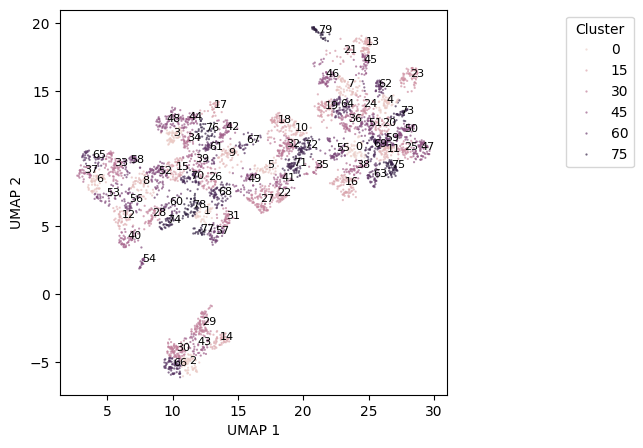

In [46]:
# perform clustering on the umap

from sklearn.cluster import KMeans

n_clusters = 8
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(embedding)
df_umap['high_level_cluster'] = kmeans.labels_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='high_level_cluster', s=2, alpha=0.7, ec=None)
for i in range(n_clusters):
    cluster_center = kmeans.cluster_centers_[i]
    ax.text(cluster_center[0], cluster_center[1], str(i), fontsize=8, color='black')
plt.legend(title='Cluster', loc='upper right', bbox_to_anchor=(1.5, 1))
plt.show()

n_clusters = 16
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(embedding)
df_umap['mid_level_cluster'] = kmeans.labels_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='mid_level_cluster', s=2, alpha=0.7, ec=None)
# add the number of the cluster over the mean
for i in range(n_clusters):
    cluster_center = kmeans.cluster_centers_[i]
    ax.text(cluster_center[0], cluster_center[1], str(i), fontsize=8, color='black')
plt.legend(title='Cluster', loc='upper right', bbox_to_anchor=(1.5, 1))
plt.show()

n_clusters = 80
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(embedding)
df_umap['low_level_cluster'] = kmeans.labels_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='low_level_cluster', s=2, alpha=0.7, ec=None)
# add the number of the cluster over the mean
for i in range(n_clusters):
    cluster_center = kmeans.cluster_centers_[i]
    ax.text(cluster_center[0], cluster_center[1], str(i), fontsize=8, color='black')
plt.legend(title='Cluster', loc='upper right', bbox_to_anchor=(1.5, 1))
plt.show()

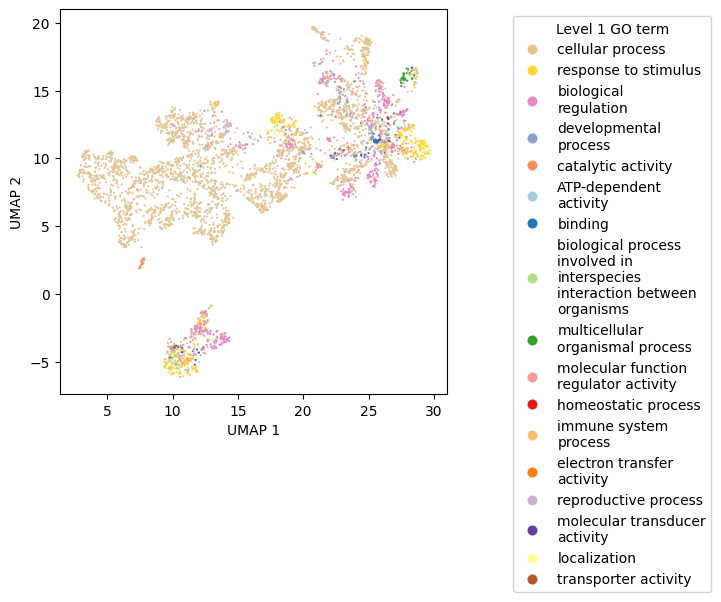

In [117]:
# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []

for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    level_1_mtrx_terms.append(temp_go_term)

df_umap['level_1_go_term'] = level_1_mtrx_terms

level1_paletteb = sns.color_palette('Paired')
level1_palettea = sns.color_palette('Set2_r')
level1_palettea = level1_palettea[:2] + level1_palettea[3:]
level1_palette = level1_palettea + level1_paletteb
level1_palette = level1_palette[:len(df_umap['level_1_go_term'].unique())]

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)
# if a legend handle is longer than 20 characters, break it up
handles, labels = ax.get_legend_handles_labels()
import textwrap
new_labels = [textwrap.fill(label, 20) for label in labels]
# also make the legend markers larger by scaling
ax.legend(handles, new_labels, title='Level 1 GO term', loc='upper right', bbox_to_anchor=(1.7, 1), markerscale=5)
plt.show()

/tmp/ipykernel_1595248/2258405966.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


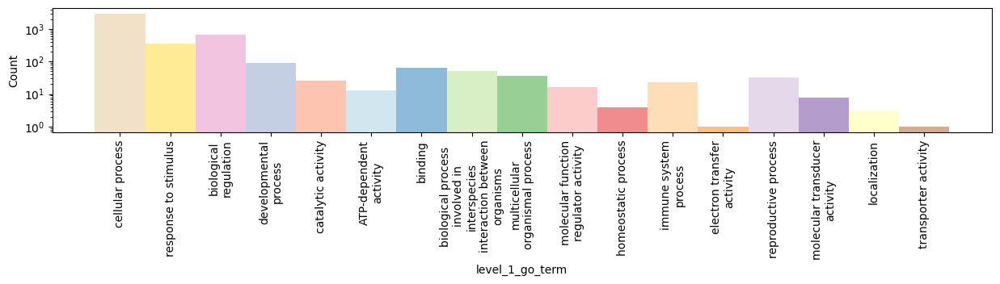

In [119]:
# plot a histogram of the first level go terms

fig, ax = plt.subplots(1, 1, figsize=(15, 2))
# add a gap between the bars
sns.histplot(data=df_umap, x='level_1_go_term', ax=ax, hue='level_1_go_term', palette=level1_palette, linewidth=0)
# rotate the x-axis labels
ticklabels = ax.get_xticklabels()
# wrap the labels
ticklabels = [textwrap.fill(label.get_text(), 20) for label in ticklabels]
ax.set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
# remove legend
ax.legend().remove()
# log scale
ax.set_yscale('log')
plt.show()

In [141]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

plt.rcParams.update({'font.size': 14})
plt.rcParams.update({'legend.fontsize': 'small'})

/tmp/ipykernel_1595248/2329128686.py:149: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_list[-1].set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


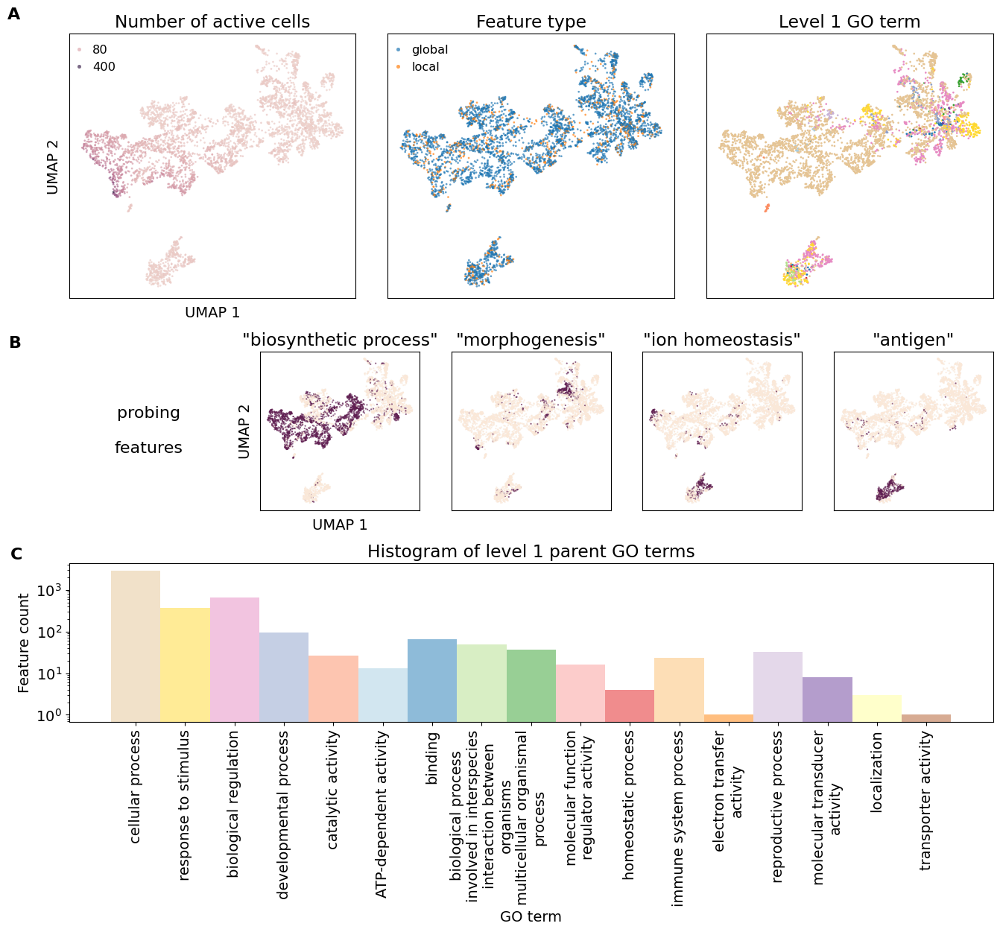

In [189]:
# create a nice grid plot with 6 columns and 4 rows

n_cols = 15
n_rows = 7

legend_x = 0.2
legend_y = 1
handletextpad = 0.1
markerscale = 2

fig = plt.figure(figsize=(16, 12))
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(n_rows, n_cols, wspace=1.0, hspace=1.0)
ax_list = []

# the first row are umaps and span over 2 rows
ax_list.append(plt.subplot(gs[0:3, 0:5]))
# add "A" on the grid
ax_list[0].text(-0.17, 1.1, 'A', transform=ax_list[0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
# here color by number of cells
n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=3, alpha=0.7, ec=None, ax=ax_list[0])
# remove all ticks
ax_list[0].set_xticks([])
ax_list[0].set_yticks([])
# move the legend outside
# keep only the first and last legend handles and labels
handles, labels = ax_list[0].get_legend_handles_labels()
handles = [handles[0], handles[-1]]
labels = [labels[0], labels[-1]]
ax_list[0].legend(handles, labels, loc='upper right', bbox_to_anchor=(legend_x, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[0].set_title('Number of active cells')

# next plot a umap colored by feature type
ax_list.append(plt.subplot(gs[0:3, 5:10]))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='feature_type', s=3, alpha=0.7, ec=None, ax=ax_list[1])
ax_list[1].set_xticks([])
ax_list[1].set_yticks([])
ax_list[1].set_xlabel('')
ax_list[1].set_ylabel('')
ax_list[1].legend(loc='upper right', bbox_to_anchor=(legend_x+0.05, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[1].set_title('Feature type')

# next plot a umap colored by level1 go term
ax_list.append(plt.subplot(gs[0:3, 10:]))
# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []
for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    level_1_mtrx_terms.append(temp_go_term)
df_umap['level_1_go_term'] = level_1_mtrx_terms
level1_paletteb = sns.color_palette('Paired')
level1_palettea = sns.color_palette('Set2_r')
level1_palettea = level1_palettea[:2] + level1_palettea[3:]
level1_palette = level1_palettea + level1_paletteb
level1_palette = level1_palette[:len(df_umap['level_1_go_term'].unique())]
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=3, alpha=1, ec=None, palette=level1_palette, ax=ax_list[2])
ax_list[2].set_xticks([])
ax_list[2].set_yticks([])
ax_list[2].set_xlabel('')
ax_list[2].set_ylabel('')
ax_list[2].set_title('Level 1 GO term')
# remove the legend
ax_list[2].legend().remove()

binary_colors = sns.color_palette('rocket_r', 100)
binary_colors = [binary_colors[0], binary_colors[75]]

ax_list.append(plt.subplot(gs[3:5, 0:3]))
ax_list[-1].text(-0.3, 1.1, 'B', transform=ax_list[-1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
#wordcloud = WordCloud(width=200, height=200, background_color ='white').generate(' '.join(mtrx_go_names))
#ax_list[-1].imshow(wordcloud)
# plot text instead of wordcloud
ax_list[-1].text(0.5, 0.5, 'probing\n\nfeatures', fontsize=16, ha='center', va='center')
ax_list[-1].axis('off')

ax_list.append(plt.subplot(gs[3:5, 3:6]))
term_snippet = 'biosynthetic process'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 6:9]))
term_snippet = 'morphogenesis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 9:12]))
term_snippet = 'ion homeostasis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 12:]))
term_snippet = 'antigen'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

# the bottom row is the histogram of the level 1 go terms
ax_list.append(plt.subplot(gs[5:, :]))
ax_list[-1].text(-0.05, 1.1, 'C', transform=ax_list[-1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
sns.histplot(data=df_umap, x='level_1_go_term', ax=ax_list[-1], hue='level_1_go_term', palette=level1_palette, linewidth=0)
# rotate the x-axis labels
ticklabels = ax_list[-1].get_xticklabels()
# wrap the labels
ticklabels = [textwrap.fill(label.get_text(), 25) for label in ticklabels]
ax_list[-1].set_xticklabels(ticklabels, rotation=90, horizontalalignment='center')
# remove legend
ax_list[-1].legend().remove()
# log scale
ax_list[-1].set_yscale('log')
ax_list[-1].set_xlabel('GO term')
ax_list[-1].set_ylabel('Feature count')
ax_list[-1].set_title('Histogram of level 1 parent GO terms')

# save as a pdf
plt.savefig('03_results/figures/sc_automatic_feature_analysis.pdf', bbox_inches='tight')
plt.show()

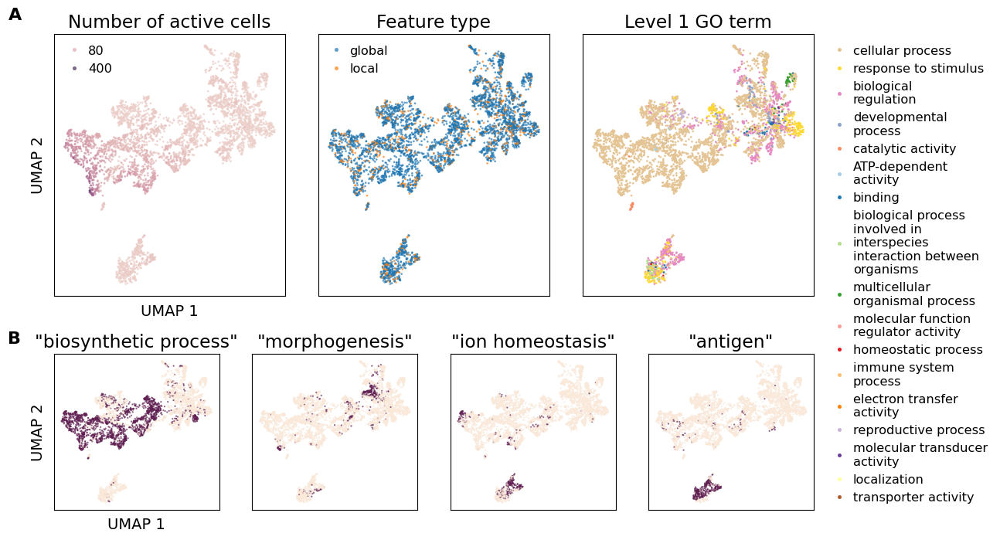

In [201]:
# create a nice grid plot with 6 columns and 4 rows

n_cols = 15
n_rows = 5

legend_x = 0.3
legend_y = 1
handletextpad = 0.1
markerscale = 2

fig = plt.figure(figsize=(16, 8))
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(n_rows, n_cols, wspace=1.0, hspace=1.2)
ax_list = []

# the first row are umaps and span over 2 rows
ax_list.append(plt.subplot(gs[0:3, 0:4]))
# add "A" on the grid
ax_list[0].text(-0.14, 1.1, 'A', transform=ax_list[0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
# here color by number of cells
n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=3, alpha=0.7, ec=None, ax=ax_list[0])
# remove all ticks
ax_list[0].set_xticks([])
ax_list[0].set_yticks([])
# move the legend outside
# keep only the first and last legend handles and labels
handles, labels = ax_list[0].get_legend_handles_labels()
handles = [handles[0], handles[-1]]
labels = [labels[0], labels[-1]]
ax_list[0].legend(handles, labels, loc='upper right', bbox_to_anchor=(legend_x, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[0].set_title('Number of active cells')

# next plot a umap colored by feature type
ax_list.append(plt.subplot(gs[0:3, 4:8]))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='feature_type', s=3, alpha=0.7, ec=None, ax=ax_list[1])
ax_list[1].set_xticks([])
ax_list[1].set_yticks([])
ax_list[1].set_xlabel('')
ax_list[1].set_ylabel('')
ax_list[1].legend(loc='upper right', bbox_to_anchor=(legend_x+0.05, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale)
ax_list[1].set_title('Feature type')

# next plot a umap colored by level1 go term
ax_list.append(plt.subplot(gs[0:3, 8:12]))
# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []
for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    level_1_mtrx_terms.append(temp_go_term)
df_umap['level_1_go_term'] = level_1_mtrx_terms
level1_paletteb = sns.color_palette('Paired')
level1_palettea = sns.color_palette('Set2_r')
level1_palettea = level1_palettea[:2] + level1_palettea[3:]
level1_palette = level1_palettea + level1_paletteb
level1_palette = level1_palette[:len(df_umap['level_1_go_term'].unique())]
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=3, alpha=1, ec=None, palette=level1_palette, ax=ax_list[2])
ax_list[2].set_xticks([])
ax_list[2].set_yticks([])
ax_list[2].set_xlabel('')
ax_list[2].set_ylabel('')
ax_list[2].set_title('Level 1 GO term')
#ax_list[2].legend().remove()
# wrap the text for the legend
handles, labels = ax_list[2].get_legend_handles_labels()
labels = [textwrap.fill(label, 20) for label in labels]
ax_list[2].legend(handles, labels, loc='upper right', bbox_to_anchor=(1.8, legend_y), frameon=False, handletextpad=handletextpad, markerscale=markerscale, ncol=1)

binary_colors = sns.color_palette('rocket_r', 100)
binary_colors = [binary_colors[0], binary_colors[75]]

ax_list.append(plt.subplot(gs[3:5, 0:3]))
ax_list[-1].text(-0.2, 1.15, 'B', transform=ax_list[-1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
term_snippet = 'biosynthetic process'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 3:6]))
term_snippet = 'morphogenesis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 6:9]))
term_snippet = 'ion homeostasis'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

ax_list.append(plt.subplot(gs[3:5, 9:12]))
term_snippet = 'antigen'
test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, palette=binary_colors, ax=ax_list[-1])
ax_list[-1].set_xticks([])
ax_list[-1].set_yticks([])
ax_list[-1].set_xlabel('')
ax_list[-1].set_ylabel('')
ax_list[-1].set_title('"{}"'.format(term_snippet))
# remove the legend
ax_list[-1].legend().remove()

# save as a pdf
plt.savefig('03_results/figures/sc_automatic_feature_analysis_2.pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_775528/1406828210.py:36: UserWarning: 
The palette list has fewer values (38) than needed (39) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', hue='level_2_go_term', s=5, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=large_color_palette)
/tmp/ipykernel_775528/1406828210.py:36: UserWarning: 
The palette list has fewer values (38) than needed (39) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', hue='level_2_go_term', s=5, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=large_color_palette)
/tmp/ipykernel_775528/1406828210.py:36: UserWarning: 
The palette list has fewer values (38) than needed (39) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', hue='level_2_go_term', s=5, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=large_color_palette)
/tmp/ipyke

[]

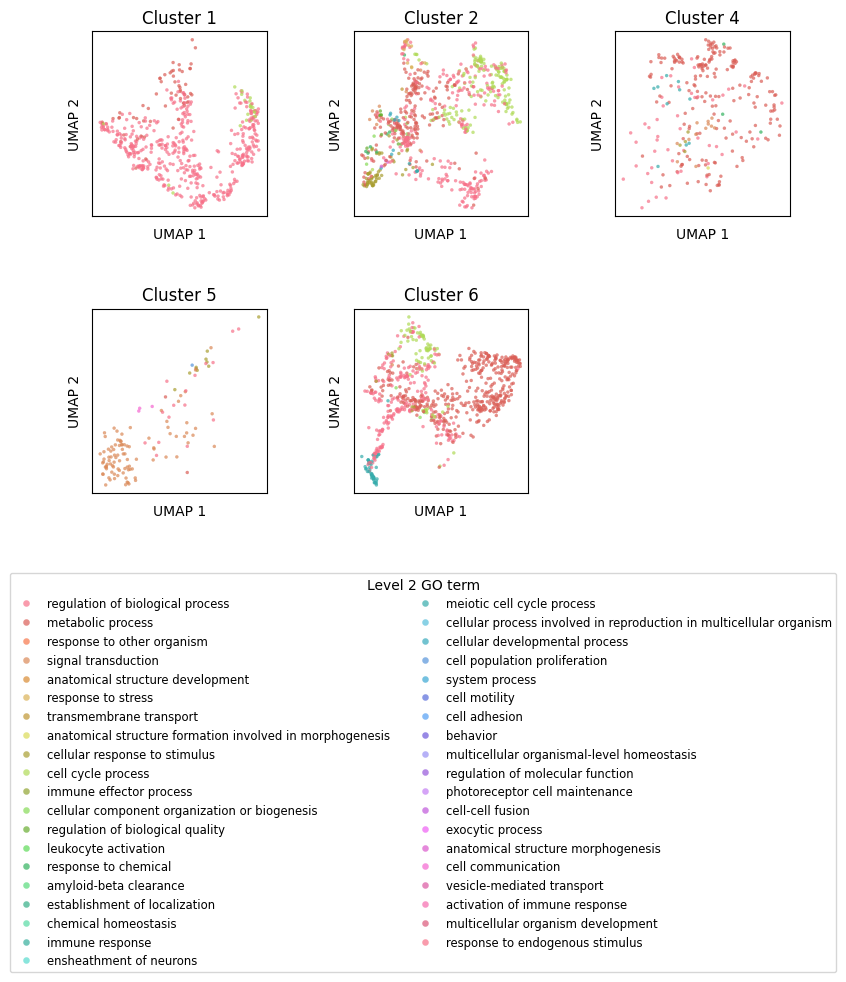

In [119]:
# go through all high level clusters and plot each with the second level go term
import textwrap

# set legend text smaller
plt.rcParams.update({'legend.fontsize': 'small'})

clusters_of_interest = [1,2,4,5,6]
#n_clusters = len(df_umap['high_level_cluster'].unique())
n_clusters = len(clusters_of_interest)
n_cols = 3
n_rows = math.ceil(n_clusters/n_cols)

level_2_mtrx_terms = []
for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level2'].value_counts().index[0]
    level_2_mtrx_terms.append(temp_go_term)
df_umap['level_2_go_term'] = level_2_mtrx_terms
# make them categorical
df_umap['level_2_go_term'] = pd.Categorical(df_umap['level_2_go_term'], categories=df_umap['level_2_go_term'].unique(), ordered=True)
# add a categorical for style to distinguish the many go terms better
#unique_level2_terms = list(df_umap['level_2_go_term'].unique())
#print(unique_level2_terms)
#df_umap['level_2_go_term_style'] = [unique_level2_terms.index(x) % 3 for x in df_umap['level_2_go_term']]

large_color_palette_a = sns.color_palette('husl', n_colors=int(len(df_umap['level_2_go_term'].unique())/2))
large_color_palette_b = sns.color_palette('hls', n_colors=int(len(df_umap['level_2_go_term'].unique())/2))
# mix them up (alternate)
large_color_palette = [val for pair in zip(large_color_palette_a, large_color_palette_b) for val in pair]

fig, ax = plt.subplots(n_rows, n_cols, figsize=(3*n_cols, 3*n_rows))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for i in range(n_clusters):
    #temp_df = df_umap[df_umap['high_level_cluster'] == i]
    temp_df = df_umap[df_umap['high_level_cluster'] == clusters_of_interest[i]]
    sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', hue='level_2_go_term', s=5, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=large_color_palette)
    #ax[i//n_cols, i%n_cols].set_title('Cluster {}'.format(i))
    ax[i//n_cols, i%n_cols].set_title('Cluster {}'.format(clusters_of_interest[i]))
    # remove the ticks
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # make sure that all legend labels are max 20 characters long
    # remove legend unless it is the last entry
    if i != n_clusters - 1:
        ax[i//n_cols, i%n_cols].get_legend().remove()
#handles, labels = ax[i//n_cols, i%n_cols].get_legend_handles_labels()
#new_labels = [textwrap.fill(label, 20) for label in labels]
#ax[i//n_cols, i%n_cols].legend(handles, new_labels, title='Level 2 GO term', loc='upper right', bbox_to_anchor=(2.0, 1), markerscale=2)
ax[i//n_cols, i%n_cols].legend(title='Level 2 GO term', loc='upper right', bbox_to_anchor=(2.8, -0.4), markerscale=2, ncol=2)
if n_clusters % n_cols != 0:
    for i in range(n_clusters % n_cols, n_cols):
        ax[-1, i].axis('off')
plt.plot()

[]

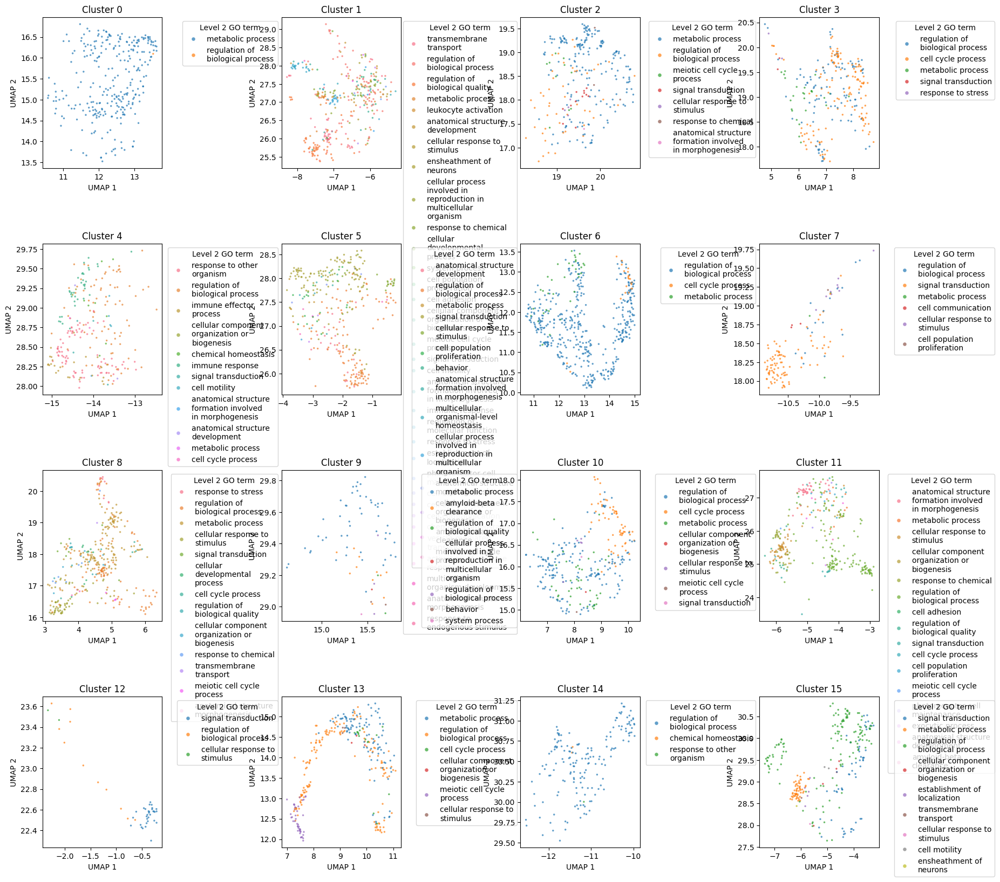

In [86]:
# go through all high level clusters and plot each with the second level go term
import textwrap

n_clusters = len(df_umap['mid_level_cluster'].unique())
n_cols = 4
n_rows = math.ceil(n_clusters/n_cols)

level_2_mtrx_terms = []
for feat in mtrx_feature_ids:
    feat = feat.item()
    temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level2'].value_counts().index[0]
    level_2_mtrx_terms.append(temp_go_term)
df_umap['level_2_go_term'] = level_2_mtrx_terms

fig, ax = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
plt.subplots_adjust(hspace=0.5, wspace=1.0)
for i in range(n_clusters):
    temp_df = df_umap[df_umap['mid_level_cluster'] == i]
    sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', hue='level_2_go_term', s=5, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Cluster {}'.format(i))
    # make sure that all legend labels are max 20 characters long
    handles, labels = ax[i//n_cols, i%n_cols].get_legend_handles_labels()
    new_labels = [textwrap.fill(label, 20) for label in labels]
    ax[i//n_cols, i%n_cols].legend(handles, new_labels, title='Level 2 GO term', loc='upper right', bbox_to_anchor=(2.0, 1), markerscale=2)
plt.plot()

['positive regulation of cytosolic calcium ion concentration'
 'calcium-mediated signaling' 'calcium ion homeostasis'
 'cellular response to calcium ion' 'calcium ion transmembrane transport'
 'regulation of release of sequestered calcium ion into cytosol by sarcoplasmic reticulum'
 'release of sequestered calcium ion into cytosol'
 'positive regulation of calcium ion transport' 'calcium ion transport'
 'intracellular calcium ion homeostasis'
 'regulation of calcium-mediated signaling'
 'regulation of calcium ion transport'
 'positive regulation of release of sequestered calcium ion into cytosol'
 'response to calcium ion' 'calcium channel regulator activity'
 'calcium ion binding'
 'calcium/calmodulin-dependent protein kinase activity'
 'calcium-dependent protein binding' 'calcium channel activity'
 'calcium-dependent phospholipid binding']


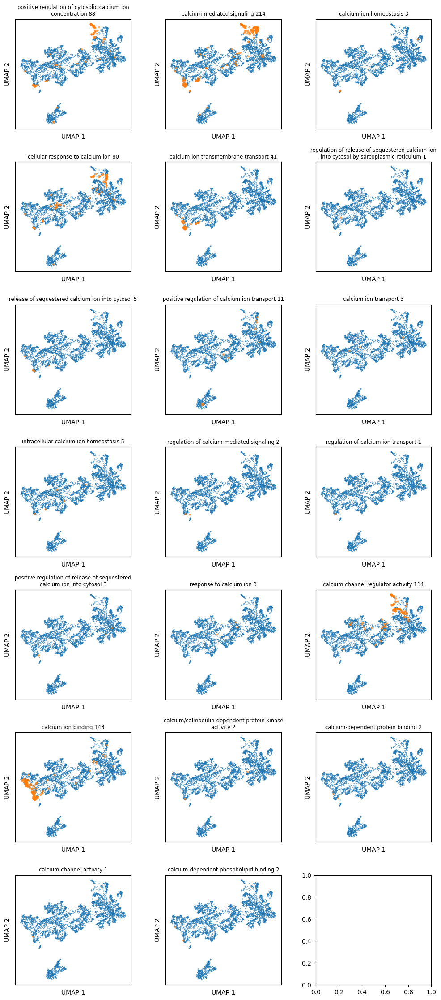

In [48]:
import textwrap

# find all GO terms with "calcium"
calcium_go_terms = go_df[go_df['go_name'].str.contains('calcium', case=False)]['go_name'].unique()
print(calcium_go_terms)

selected_test_terms = calcium_go_terms

# make the title font size smaller
plt.rcParams.update({'axes.titlesize': 'small'})

n_cols = 3
n_rows = math.ceil(len(selected_test_terms) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*4))
plt.subplots_adjust(hspace=0.3, wspace=0.3)

count = 0
for test_term in selected_test_terms:
    #print('GO term: {}'.format(test_term))
    df_umap[test_term] = go_feature_matrix[mtrx_go_names.index(test_term),:]
    #fig, ax = plt.subplots(1, 1, figsize=(3, 3))
    sns.scatterplot(
        data=df_umap.sort_values(test_term, ascending=True), 
        x='UMAP 1', y='UMAP 2', 
        hue=test_term, size=test_term, 
        sizes=(10,2), alpha=0.7, ec=None, ax=ax[count//n_cols, count%n_cols])
    ax[count//n_cols, count%n_cols].get_legend().remove()
    #plt.legend(title=test_term, loc='upper right', bbox_to_anchor=(2., 1)).remove()
    ax[count//n_cols, count%n_cols].set_xticks([])
    ax[count//n_cols, count%n_cols].set_yticks([])
    title_text = textwrap.fill(test_term, 50)
    ax[count//n_cols, count%n_cols].set_title(title_text + ' ' + str(int(go_feature_matrix[mtrx_go_names.index(test_term),:].sum().item())))
    #plt.title(test_term + ' ' + str(go_feature_matrix[mtrx_go_names.index(test_term),:].sum().item()))
    #plt.show()
    count += 1
    #break

plt.show()

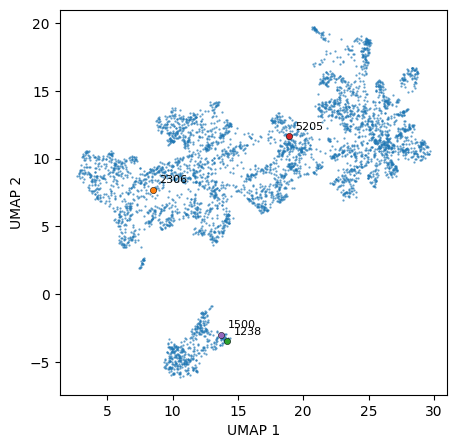

In [49]:
# show me where feature 2306 is
special_features = [2306, 1238, 5205, 1500]

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None, ax=ax)
for feat in special_features:
    temp_df = df_umap[df_umap['feature'] == feat]
    sns.scatterplot(data=temp_df, x='UMAP 1', y='UMAP 2', s=20, ec='black', ax=ax)
    # write the feature number next to the point
    for i, row in temp_df.iterrows():
        ax.text(row['UMAP 1']+0.5, row['UMAP 2']+0.5, row['feature'], fontsize=8, color='black')
plt.show()

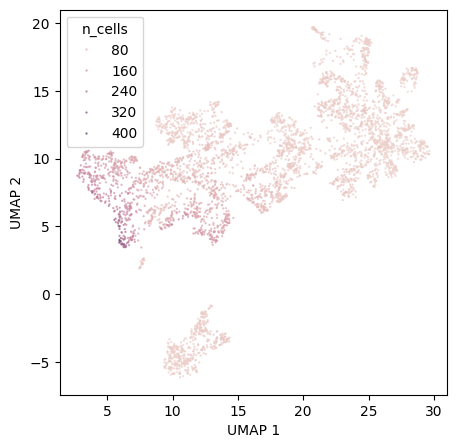

In [50]:
# plot the umap colored by number of cells per feature

n_cells_per_feature = go_feature_matrix.sum(dim=0).numpy()
df_umap['n_cells'] = n_cells_per_feature

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='n_cells', s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

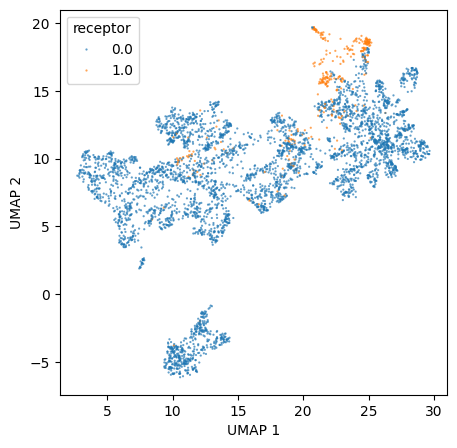

In [51]:
# what about receptors

receptor_go_terms = [1 if 'receptor' in x else 0 for x in mtrx_go_names]
receptor_counts = go_feature_matrix[receptor_go_terms,:].sum(dim=0)
# binarize
receptor_counts = (receptor_counts > 0).float()
df_umap['receptor'] = receptor_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap, x='UMAP 1', y='UMAP 2', hue='receptor', s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 5 GO terms with 'oxygen' in their name


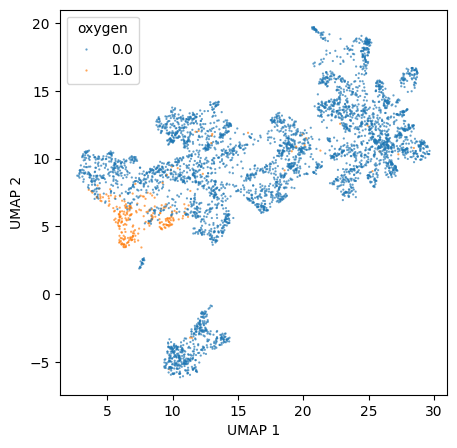

In [52]:
# what about receptors

term_snippet = 'oxygen'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 4 GO terms with 'peroxide' in their name


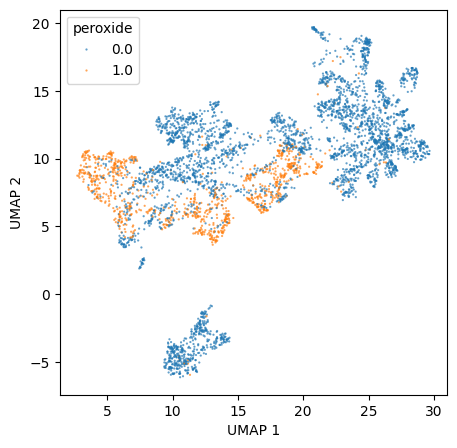

In [53]:
# what about receptors

term_snippet = 'peroxide'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 67 GO terms with 'DNA' in their name


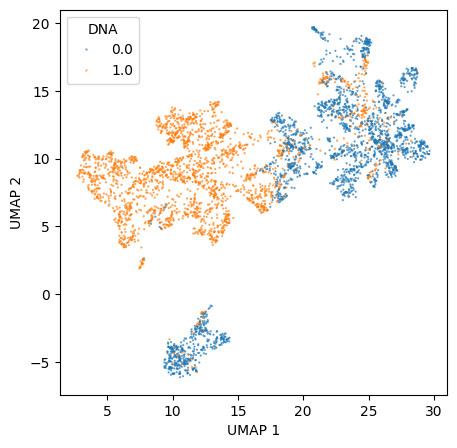

In [54]:
# what about receptors

term_snippet = 'DNA'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 16 GO terms with 'replication' in their name


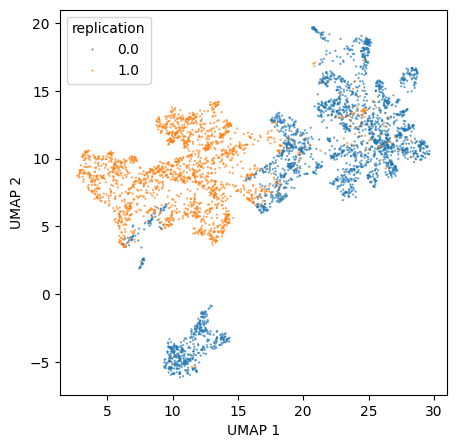

In [55]:
# what about receptors

term_snippet = 'replication'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 12 GO terms with 'chromosome' in their name


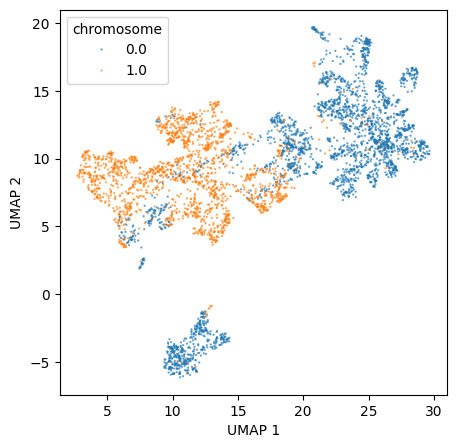

In [56]:
# what about receptors

term_snippet = 'chromosome'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 28 GO terms with 'differentiation' in their name


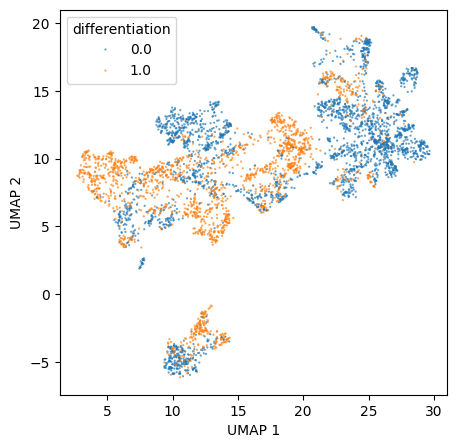

In [57]:
# what about receptors

term_snippet = 'differentiation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 30 GO terms with 'proliferation' in their name


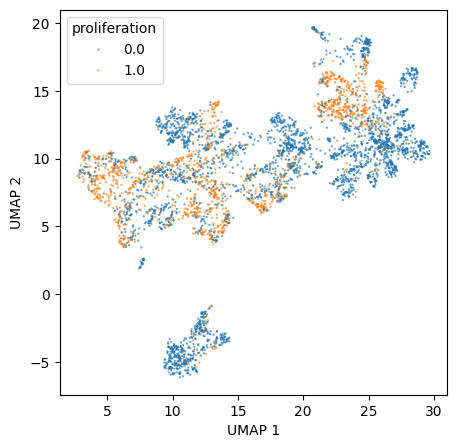

In [58]:
# what about receptors

term_snippet = 'proliferation'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 17 GO terms with 'catabol' in their name


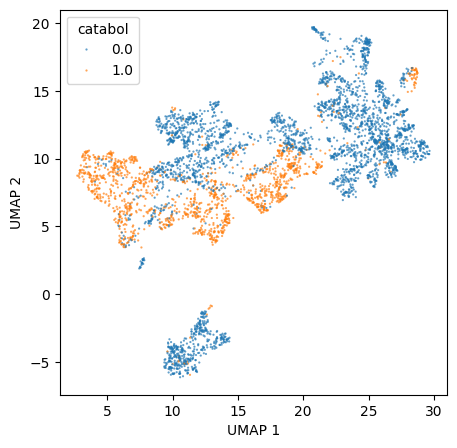

In [59]:
# what about receptors

term_snippet = 'catabol'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 24 GO terms with 'biosynth' in their name


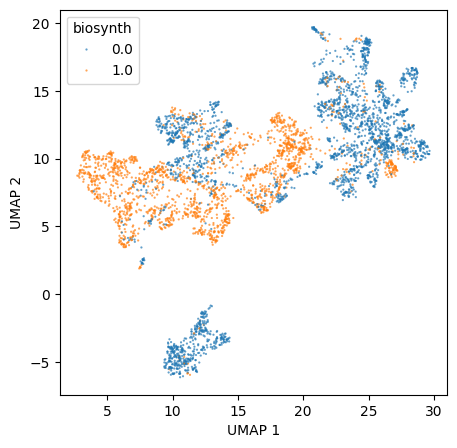

In [60]:
# what about receptors

term_snippet = 'biosynth'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 7 GO terms with 'blood' in their name


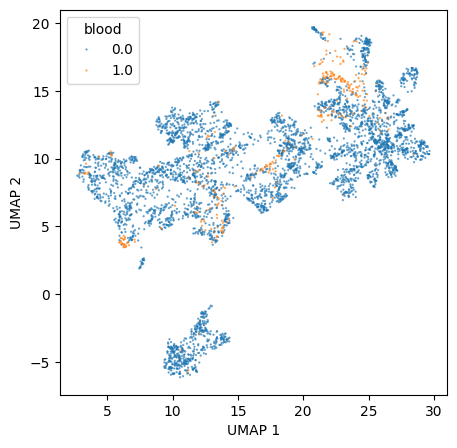

In [61]:
# what about receptors

term_snippet = 'blood'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 8 GO terms with 'iron' in their name


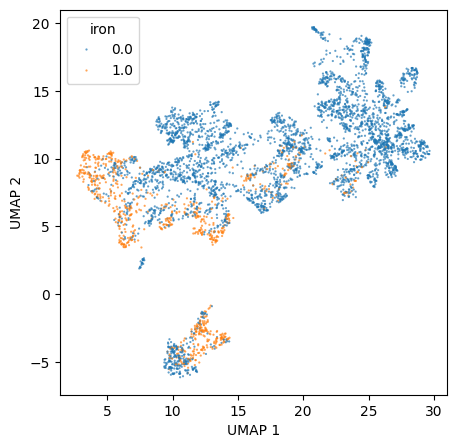

In [62]:
# what about receptors

term_snippet = 'iron'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 86 GO terms with 'receptor' in their name


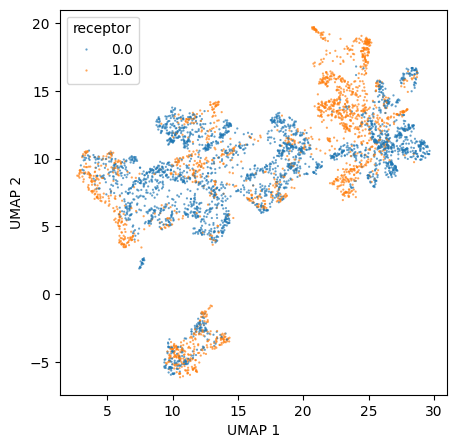

In [63]:
# what about receptors

term_snippet = 'receptor'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 20 GO terms with 'calcium' in their name


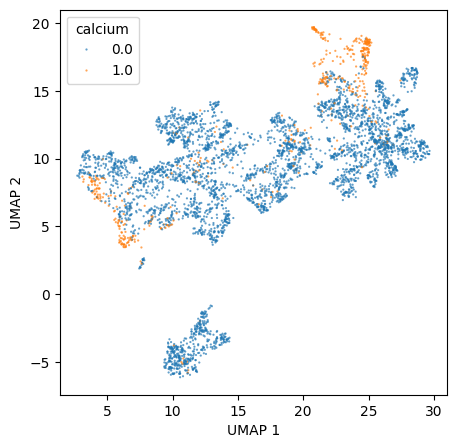

In [64]:
# what about receptors

term_snippet = 'calcium'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 6 GO terms with 'potassium' in their name


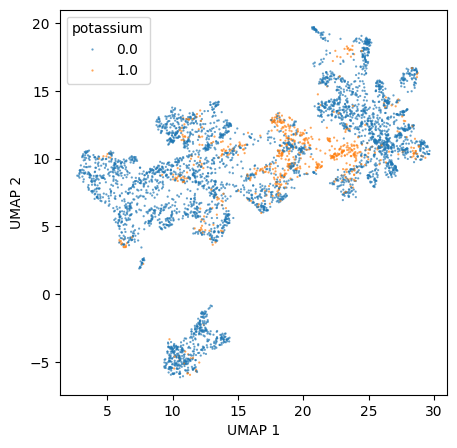

In [65]:
# what about receptors

term_snippet = 'potassium'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 4 GO terms with 'erythro' in their name


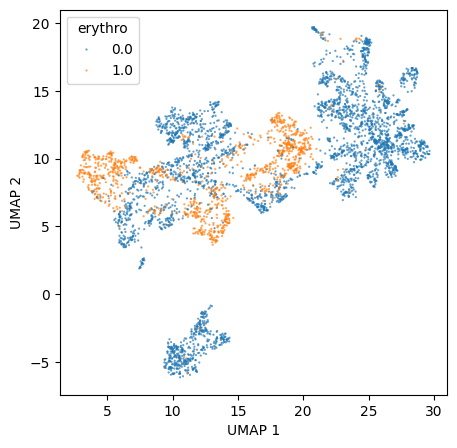

In [66]:
# what about receptors

term_snippet = 'erythro'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 32 GO terms with ' ion ' in their name


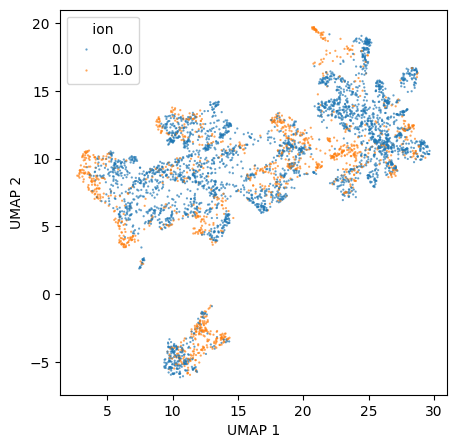

In [67]:
# what about receptors

term_snippet = ' ion '

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 6 GO terms with 'innate' in their name


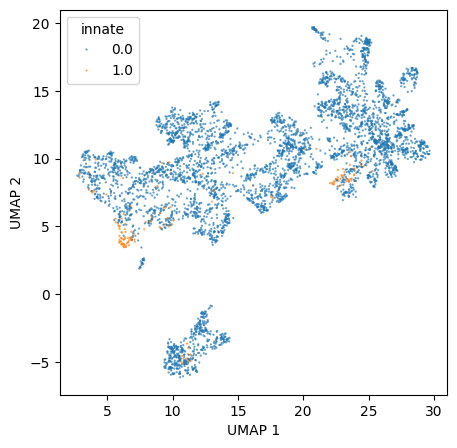

In [68]:
# what about receptors

term_snippet = 'innate'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 1 GO terms with 'adaptive' in their name


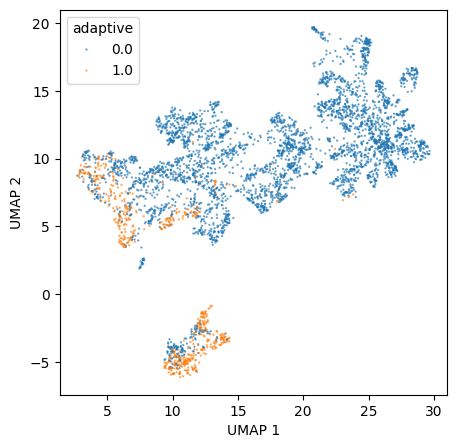

In [69]:
# what about receptors

term_snippet = 'adaptive'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 20 GO terms with 'transmembrane' in their name


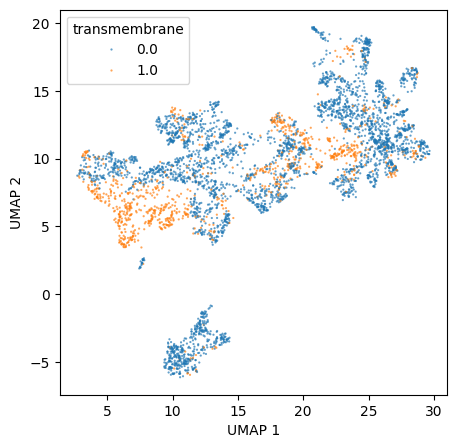

In [70]:
# what about receptors

term_snippet = 'transmembrane'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 1 GO terms with 'bacteria' in their name


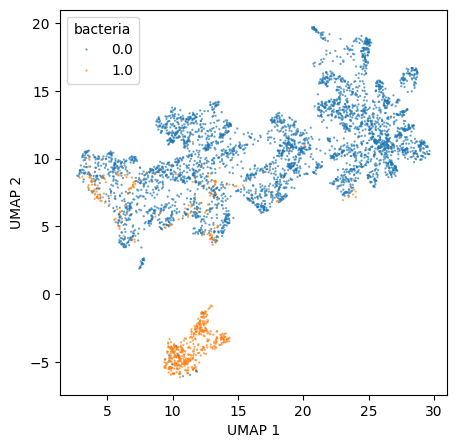

In [71]:
# what about receptors

term_snippet = 'bacteria'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 6 GO terms with 'viral' in their name


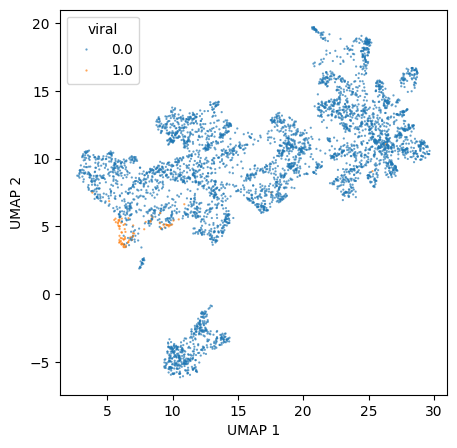

In [72]:
# what about receptors

term_snippet = 'viral'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 6 GO terms with 'B cell' in their name


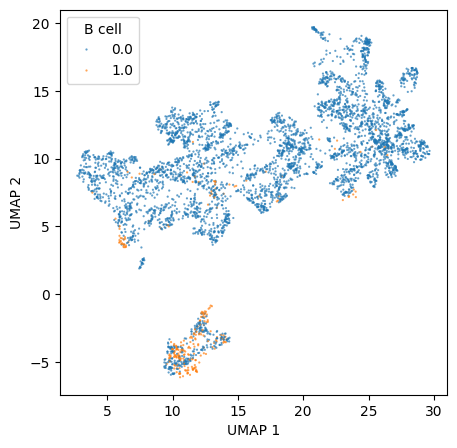

In [73]:
# what about receptors

term_snippet = 'B cell'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 25 GO terms with 'apopt' in their name


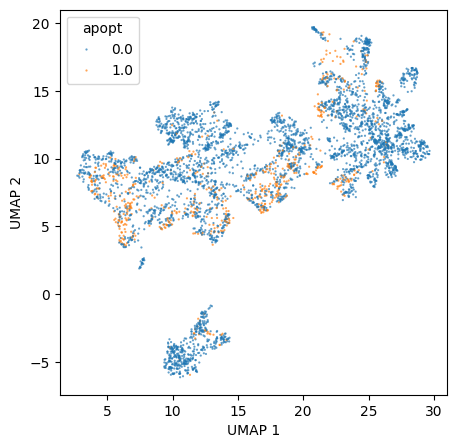

In [74]:
# what about receptors

term_snippet = 'apopt'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 16 GO terms with 'interleukin' in their name


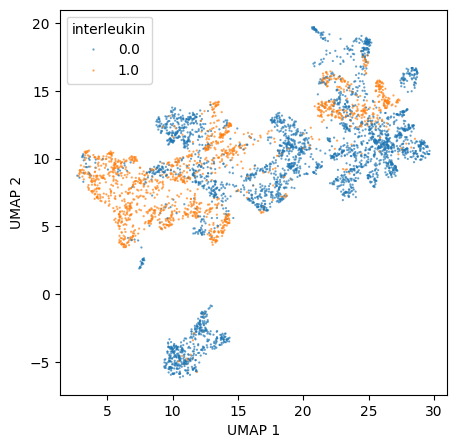

In [75]:
# what about receptors

term_snippet = 'interleukin'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 2 GO terms with 'interleukin-4' in their name


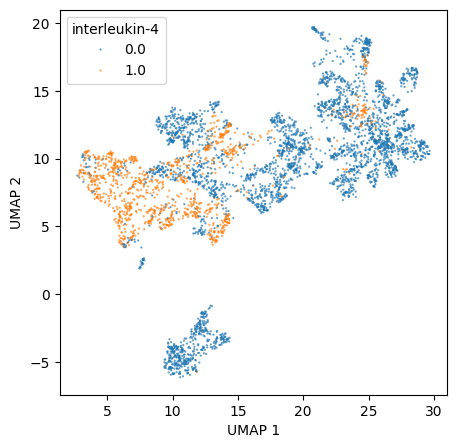

In [76]:
# what about receptors

term_snippet = 'interleukin-4'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 1 GO terms with 'interleukin-7' in their name


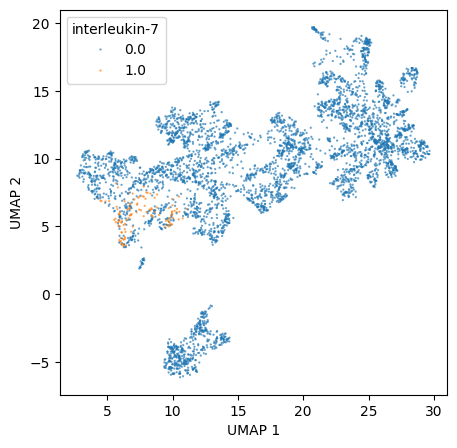

In [77]:
# what about receptors

term_snippet = 'interleukin-7'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 2 GO terms with 'interleukin-2' in their name


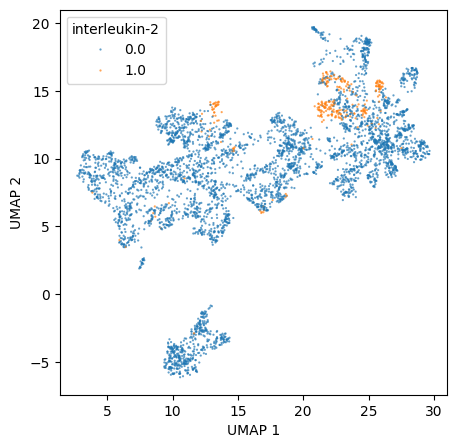

In [78]:
# what about receptors

term_snippet = 'interleukin-2'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 8 GO terms with 'saccharide' in their name


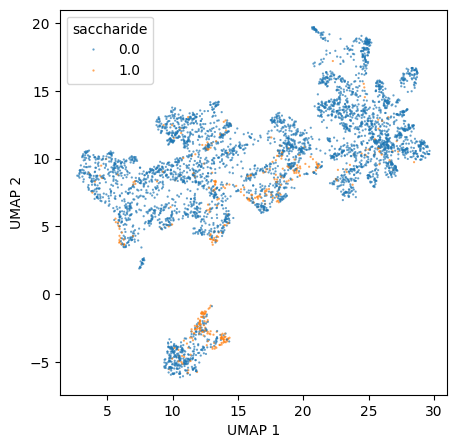

In [79]:
# what about receptors

term_snippet = 'saccharide'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 115 GO terms with 'signal' in their name


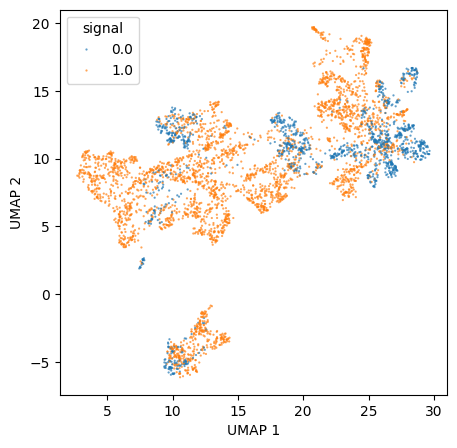

In [80]:
# what about receptors

term_snippet = 'signal'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 4 GO terms with 'ERK1' in their name


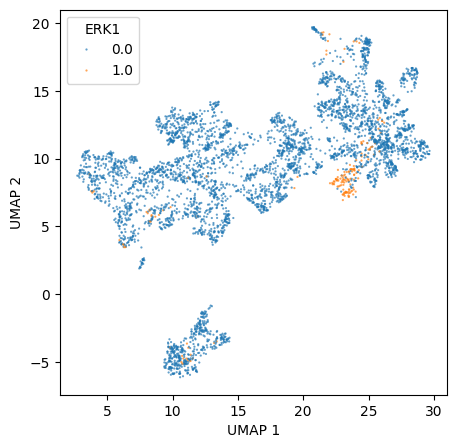

In [81]:
# what about receptors

term_snippet = 'ERK1'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

Found 172 GO terms with 'binding' in their name


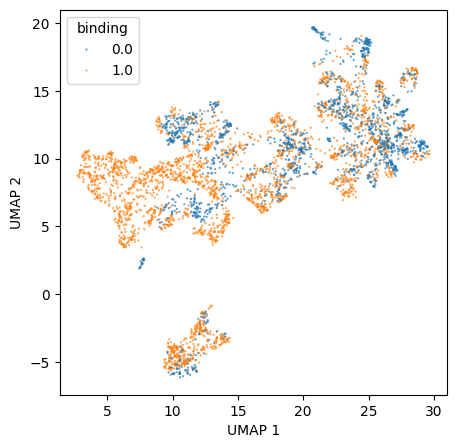

In [83]:
# what about receptors

term_snippet = 'binding'

test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
#print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
#test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
test_counts = (test_counts > 0).float()
df_temp = df_umap.copy()
df_temp[term_snippet] = test_counts.numpy()

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=2, alpha=0.7, ec=None, ax=ax)
plt.show()

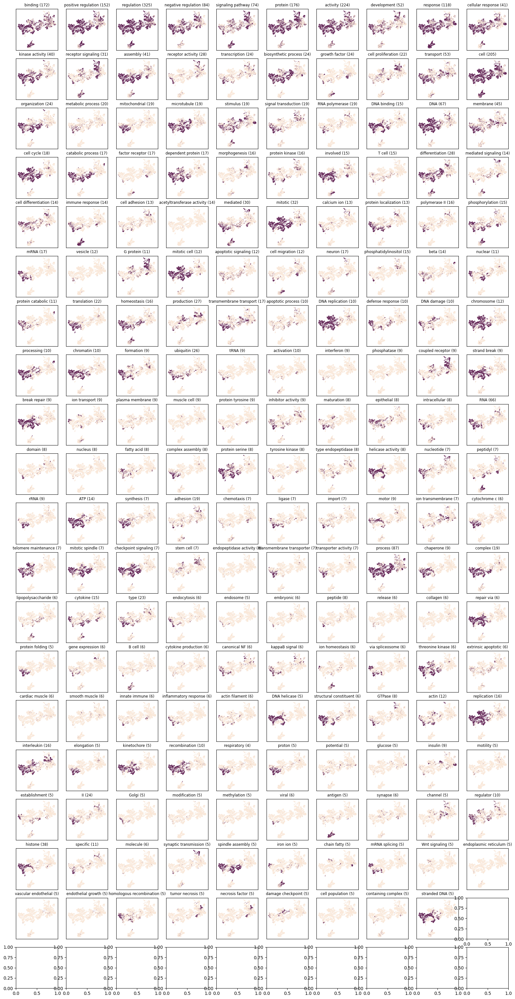

In [96]:
n_cols = 10
n_rows = math.ceil(len(wordcloud.words_.keys()) / n_cols)

binary_colors = sns.color_palette('rocket_r', 100)
binary_colors = [binary_colors[0], binary_colors[75]]

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))

i = 0
for term_snippet in wordcloud.words_.keys():
    test_go_terms = np.asarray([1 if term_snippet in x else 0 for x in mtrx_go_names]).astype(bool)
    if sum(test_go_terms) == 0:
        continue
    #print([mtrx_go_names[i] for i, x in enumerate(test_go_terms) if x == 1])
    #print(f"Found {sum(test_go_terms)} GO terms with '{term_snippet}' in their name")
    test_counts = go_feature_matrix[test_go_terms,:].clone().sum(dim=0).int()
    #test_counts = go_feature_matrix[:,:].clone().sum(dim=0).int()
    test_counts = (test_counts > 0).float()
    df_temp = df_umap.copy()
    df_temp[term_snippet] = test_counts.numpy()
    sns.scatterplot(data=df_temp, x='UMAP 1', y='UMAP 2', hue=term_snippet, s=1, alpha=0.7, ec=None, ax=ax[i//n_cols, i%n_cols], palette=binary_colors)
    ax[i//n_cols, i%n_cols].set_title(term_snippet + f" ({sum(test_go_terms)})")
    ax[i//n_cols, i%n_cols].get_legend().remove()
    # remove ticks and labels
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    ax[i//n_cols, i%n_cols].set_xlabel('')
    ax[i//n_cols, i%n_cols].set_ylabel('')
    i += 1
plt.show()

In [82]:
go_df[go_df['feature'] == 4877]['go_name']

58613                                       cilium movement
58614     cellular response to hepatocyte growth factor ...
58615                          microtubule depolymerization
58616     positive regulation of cell migration involved...
58617                  oligosaccharide biosynthetic process
58618          immune response-regulating signaling pathway
58619                         nuclear envelope organization
58620                                motile cilium assembly
58621                    cellular response to interleukin-4
58622                                sprouting angiogenesis
58623                   telomere maintenance via telomerase
58624     negative regulation of tumor necrosis factor p...
58625     positive regulation of smoothened signaling pa...
58626     platelet-derived growth factor receptor signal...
58627                                          phagocytosis
58628                                   cell-cell signaling
58629          positive regulation of ER

### Plotting features by fold change

In [204]:
# load the PCA
df_pca = pd.read_csv("03_results/reports/human_bonemarrow_l20_h2-3_test50e_pca.csv")

feat_palette = sns.color_palette('rocket_r', as_cmap=True)

Feature 7781: cellular response to epinephrine stimulus
Feature 5734: negative regulation of phosphorylation
Feature 8179: cellular response to epinephrine stimulus
Feature 3969: negative regulation of phosphorylation
Feature 4071: negative regulation of phosphorylation
Feature 5517: cellular response to epinephrine stimulus
Feature 4131: negative regulation of phosphorylation
Feature 7797: negative regulation of phosphorylation
Feature 4351: negative regulation of phosphorylation
Feature 6551: negative regulation of phosphorylation
Feature 206: negative regulation of phosphorylation
Feature 4428: negative regulation of phosphorylation
Feature 5315: cellular response to epinephrine stimulus
Feature 5692: negative regulation of phosphorylation
Feature 1618: negative regulation of phosphorylation
Feature 8572: cellular response to epinephrine stimulus
Feature 4765: negative regulation of phosphorylation
Feature 347: negative regulation of phosphorylation
Feature 637: negative regulation 

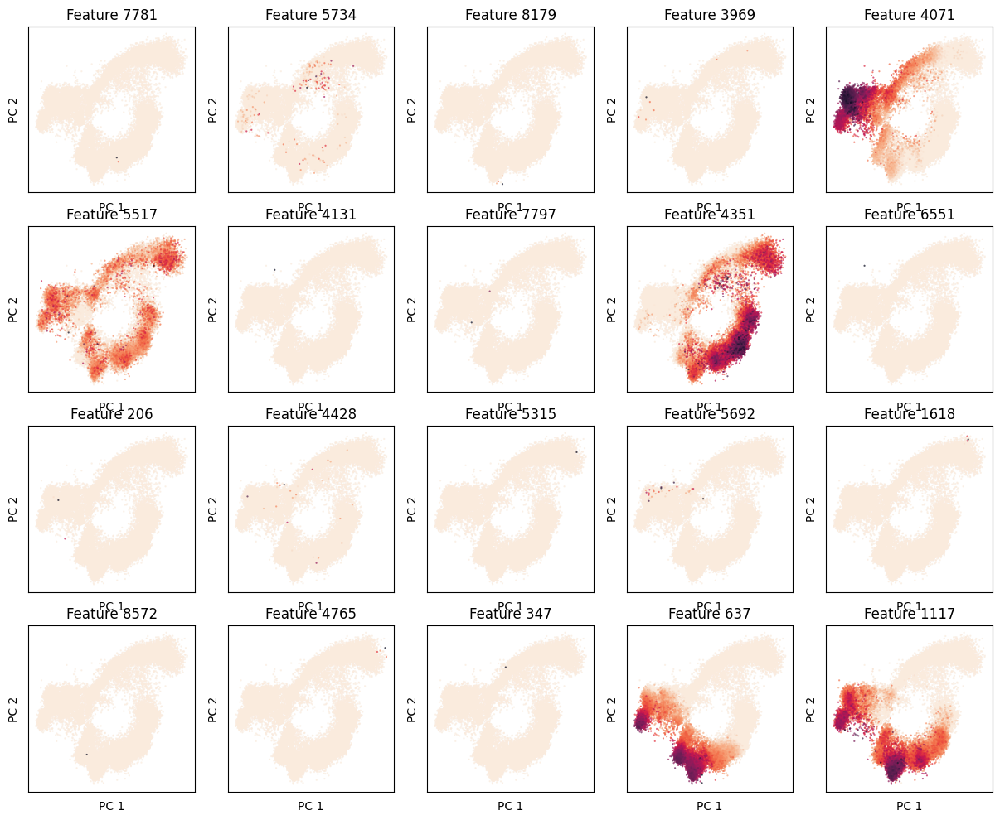

In [124]:
# now look at some global features

global_df = go_df[(go_df['feature_type'] == 'global')]
#global_df['n_active_cells'] = global_df['feature'].apply(lambda x: torch.sum(activations[:,x] != 0).item())

# sort the df by fold change and plot the top 20 features

global_df = global_df.sort_values(by='binom_fold_change', ascending=False)
#global_df = global_df.sort_values(by='n_active_cells', ascending=False)
global_df_unique = global_df['feature'].unique()

n_cols = 5
n_rows = math.ceil(20 / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

for i, feat in enumerate(global_df_unique[:20]):
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # print the top go term
    temp_go_term = go_df[go_df['feature'] == feat]['go_name'].values[0]
    print('Feature {}: {}'.format(feat, temp_go_term))
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [128]:
# what are the go terms in the top 95th percentile of global fold changes

global_df = global_df.sort_values(by='binom_fold_change', ascending=False)
percentile_99 = global_df['binom_fold_change'].quantile(0.99)
global_df_99 = global_df[global_df['binom_fold_change'] >= percentile_99]
print(global_df_99['go_name'].value_counts())
# save these valuecounts in a table
global_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_global_go_terms.csv')

antibacterial humoral response                                                                 194
G protein-coupled receptor signaling pathway, coupled to cyclic nucleotide second messenger     82
regulation of heart rate by cardiac conduction                                                  64
cellular response to epinephrine stimulus                                                       62
homologous chromosome pairing at meiosis                                                        59
                                                                                              ... 
sister chromatid cohesion                                                                        1
immunoglobulin mediated immune response                                                          1
positive regulation of cell migration involved in sprouting angiogenesis                         1
cell migration involved in sprouting angiogenesis                                                1
positive r

In [129]:
#same for local
local_df = go_df[(go_df['feature_type'] == 'local')]
local_df = local_df.sort_values(by='binom_fold_change', ascending=False)
percentile_99 = local_df['binom_fold_change'].quantile(0.99)
local_df_99 = local_df[local_df['binom_fold_change'] >= percentile_99]
print(local_df_99['go_name'].value_counts())
# save these valuecounts in a table
#local_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_local_go_terms.csv')

antibacterial humoral response                                                                 50
cellular response to epinephrine stimulus                                                      14
homologous chromosome pairing at meiosis                                                       11
regulation of heart rate by cardiac conduction                                                  9
negative regulation of phosphorylation                                                          8
regulation of exit from mitosis                                                                 8
complement activation, classical pathway                                                        8
G protein-coupled receptor signaling pathway, coupled to cyclic nucleotide second messenger     8
myeloid cell differentiation                                                                    8
hydrogen peroxide catabolic process                                                             6
positive regulation 

In [205]:
# save the one for all since there seems to be little difference

percentile_99 = go_df['binom_fold_change'].quantile(0.99)
go_df_99 = go_df[go_df['binom_fold_change'] >= percentile_99]
print(go_df_99['go_name'].value_counts())
# save these valuecounts in a table
go_df_99['go_name'].value_counts().to_csv('03_results/reports/top_99_percentile_go_terms.csv')

antibacterial humoral response                                                                 249
antigen binding                                                                                236
G protein-coupled receptor signaling pathway, coupled to cyclic nucleotide second messenger     92
cellular response to epinephrine stimulus                                                       76
regulation of heart rate by cardiac conduction                                                  73
                                                                                              ... 
negative regulation of tumor necrosis factor production                                          1
positive regulation of vascular associated smooth muscle cell proliferation                      1
positive regulation of mitotic cell cycle                                                        1
positive regulation of fibroblast proliferation                                                  1
exonucleas

In [145]:
# look for feature 2306

feat = 2306
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name
97825,6.521132e-08,30.386878,1.533583e-06,regulation of DNA-templated DNA replication in...
97826,6.521132e-08,30.386878,2.623949e-07,double-strand break repair via break-induced r...
97827,4.720143e-09,22.099548,2.305332e-10,DNA unwinding involved in DNA replication
97828,1.252904e-06,18.232127,6.190842e-05,cellular response to interleukin-4
97829,3.293034e-07,16.362165,2.122898e-07,DNA replication initiation
97830,1.094397e-03,15.193439,6.810682e-03,protein insertion into mitochondrial inner mem...
97831,1.094397e-03,15.193439,5.854727e-06,"mitochondrial electron transport, ubiquinol to..."
97832,2.061621e-03,12.154751,9.225191e-04,homologous chromosome pairing at meiosis
97833,1.209676e-02,12.154751,3.988458e-02,fatty acid beta-oxidation using acyl-CoA dehyd...
97834,1.209676e-02,12.154751,1.184402e-04,positive regulation of protein localization to...


12 3


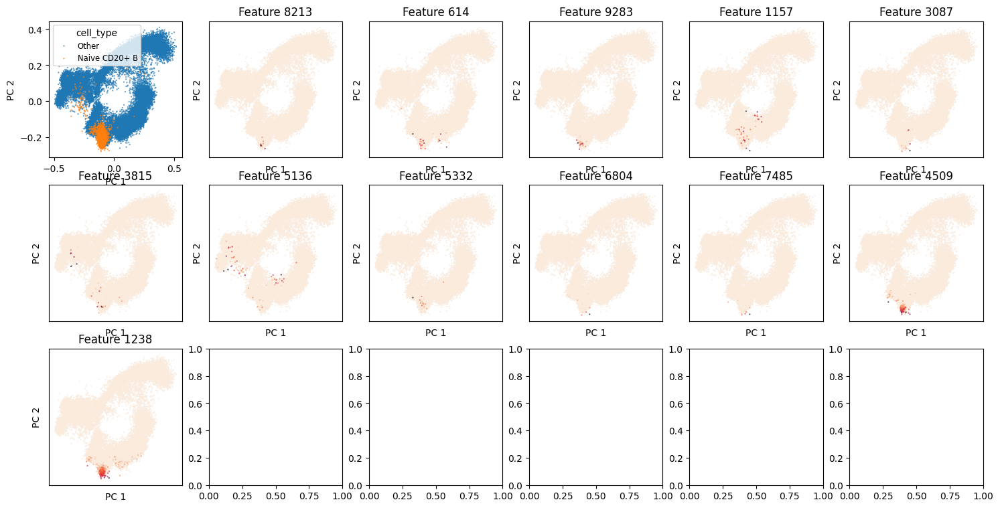

In [137]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'Naive CD20+ B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [9]:
# look for feature 2306

feat = 1238
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name
107157,9.425018e-08,314.789062,8.526277e-06,antibacterial humoral response
107158,5.940871e-03,167.887500,1.229323e-02,positive regulation of lipopolysaccharide-medi...
107159,7.717099e-03,129.144231,9.234350e-03,positive regulation of cell migration involved...
107160,9.490550e-03,104.929688,9.055606e-03,positive regulation of focal adhesion assembly
107161,1.302913e-02,76.312500,3.344732e-02,platelet-derived growth factor receptor signal...
107162,3.672763e-04,68.525510,4.600585e-04,positive regulation of peptidyl-tyrosine phosp...
107163,1.479427e-02,67.155000,1.178420e-04,positive regulation of bone mineralization
107164,1.479427e-02,67.155000,1.243822e-02,positive regulation of filopodium assembly
107165,1.948782e-02,50.875000,3.810537e-02,humoral immune response
107166,2.124284e-02,46.635417,1.600819e-02,positive regulation of osteoblast differentiation


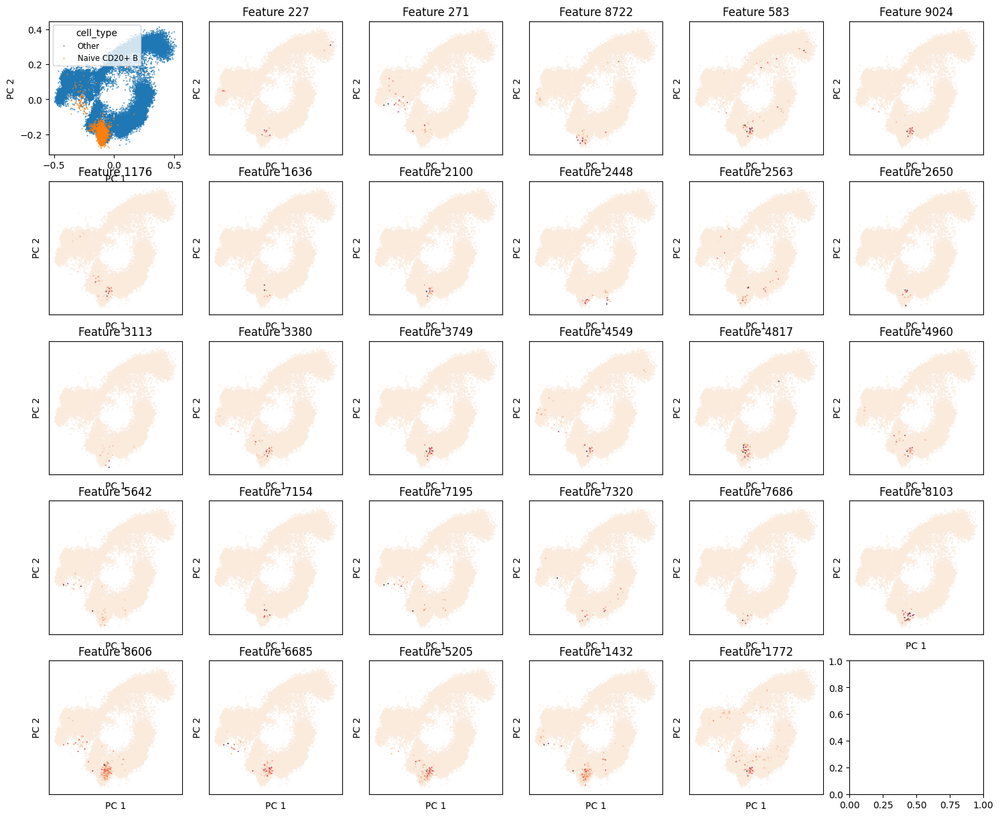

In [138]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'B1 B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

In [10]:
# look for feature 2306

feat = 5205
feat_df = go_df[go_df['feature'] == feat]
# look at the go terms for 95th percentile of fold changes
#percentile_95 = feat_df['binom_fold_change'].quantile(0.95)
#feat_df_95 = feat_df[feat_df['binom_fold_change'] >= percentile_95]
#feat_df_95['go_name'].value_counts()
feat_df[['binom_pval', 'binom_fold_change', 'mw_pval', 'go_name']]

,binom_pval,binom_fold_change,mw_pval,go_name
106195,0.005719,174.428571,1.632079e-02,regulation of microtubule polymerization or de...
106196,0.012442,79.946429,2.562342e-09,heme biosynthetic process
106197,0.025260,39.157434,6.687001e-04,erythrocyte differentiation
106198,0.034907,28.216387,2.266502e-02,cellular response to insulin stimulus


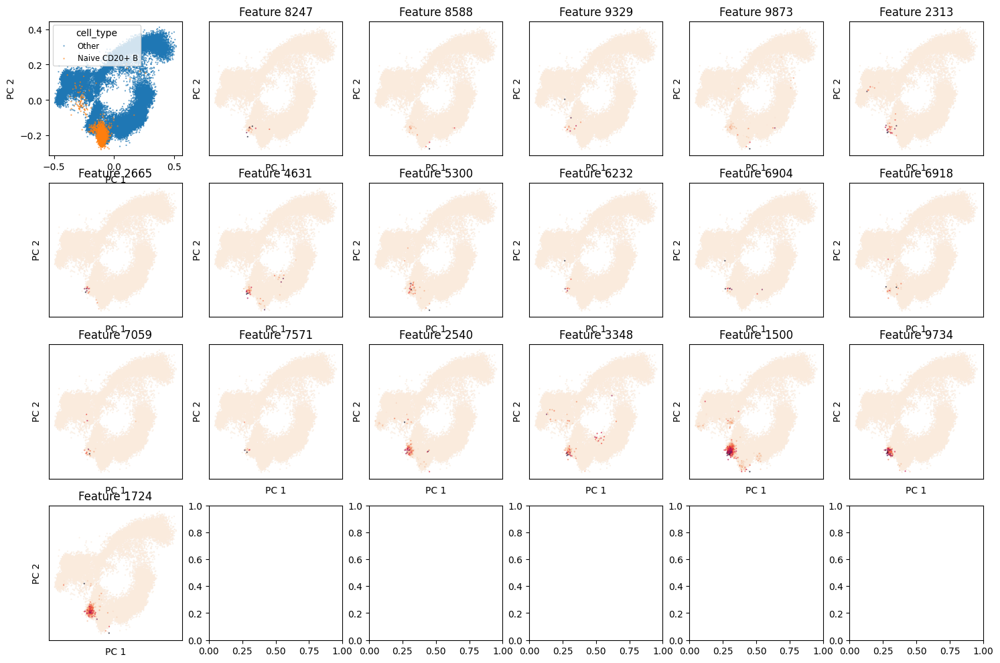

In [139]:
cd20nb_df = go_df[(go_df['feature_type'] == 'local') & (go_df['celltype'] == 'Transitional B')]

# list all go terms per feature
for feat in cd20nb_df['feature'].unique():
    #print('Feature: {}'.format(feat))
    feat_df = cd20nb_df[cd20nb_df['feature'] == feat]
    #print(feat_df.head()['go_name'].values)

n_cols = 6
n_rows = math.ceil((len(cd20nb_df['feature'].unique())+1) / n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

# first plot should just show the location of the cell type
df_temp = df_pca.copy()
df_temp['cell_type'] = ['Naive CD20+ B' if x == 'Naive CD20+ B' else 'Other' for x in data.obs['cell_type']]
# sort by cell type (with Naive CD20+ B last)
df_temp = df_temp.sort_values(by='cell_type', ascending=False)
sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='cell_type', s=2, alpha=0.7, ec=None, ax=ax[0,0])

for j, feat in enumerate(cd20nb_df['feature'].unique()):
    i = j+1
    df_temp = df_pca.copy()
    df_temp['activations'] = activations[:,feat]
    # sort by activations
    df_temp = df_temp.sort_values(by='activations', ascending=True)
    sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='activations', s=2, alpha=0.7, ec=None, palette=feat_palette, ax=ax[i//n_cols, i%n_cols])
    ax[i//n_cols, i%n_cols].set_title('Feature {}'.format(feat))
    ax[i//n_cols, i%n_cols].set_xticks([])
    ax[i//n_cols, i%n_cols].set_yticks([])
    # remove the legend
    ax[i//n_cols, i%n_cols].get_legend().remove()
plt.show()

### try to make a graph based on cosine similarity

In [13]:
import tqdm

cos_sim_activ = torch.zeros((len(active_features), len(active_features)))
for i in tqdm.tqdm(range(len(active_features))):
    cos_sim_activ[:,i] = torch.nn.functional.cosine_similarity(activations[:,active_features], activations[:,active_features[i]].unsqueeze(1), dim=0).detach().cpu()

100%|██████████| 5318/5318 [1:23:36<00:00,  1.06it/s]


In [15]:
# save the cosine similarity matrix
torch.save(cos_sim_activ, '03_results/reports/cosine_similarity_activations_active_features.pt')

In [206]:
# load it
cos_sim_activ = torch.load('03_results/reports/cosine_similarity_activations_active_features.pt')

/tmp/ipykernel_1595248/778243291.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cos_sim_activ = torch.load('03_results/reports/cosine_similarity_activations_active_feat

In [14]:
from d3graph import d3graph, vec2adjmat

# create adjacency matrix
source = []
target = []
weight = []
for i in range(cos_sim_activ.shape[0]):
    for j in range(i+1,cos_sim_activ.shape[0]):
        source.append(active_features[i])
        target.append(active_features[j])
        weight.append(cos_sim_activ[i,j].item())
adjmat = vec2adjmat(source, target, weight=weight)

In [16]:
# Initialize
d3 = d3graph()
# Proces adjmat
d3.graph(adjmat)
# Plot
d3.show()

# Make changes in node properties
#d3.set_node_properties(color=adjmat.columns.values, label=['node 1','node 2','node 3','node 4','node 5','node 6','node 7'])
# Plot
#d3.show(filepath='c://temp/')
d3.show(filepath='./d3graph_sc_cos_sim_features.html')

[d3graph] INFO> Set directed=True to see the markers!
[d3graph] INFO> Keep only edges with weight>0
[d3graph] INFO> Converting source-target into adjacency matrix..
[d3graph] INFO> Making the matrix symmetric..
[d3graph] INFO> Converting adjacency matrix into source-target..
[clustimage] >WARNING> Colormap [Set2] can not create [75] unique colors! Available unique colors: [8].
[d3graph] WARNING> Colormap [Set2] can not create [75] unique colors! Available unique colors: [8].
[d3graph] INFO> Number of unique nodes: 5318
[d3graph] INFO> Slider range is set to [0, 1]
[d3graph] INFO> Write to path: [/tmp/tmp2epd8hks/d3graph.html]
[d3graph] INFO> File already exists and will be overwritten: [/tmp/tmp2epd8hks/d3graph.html]
[d3graph] INFO> Slider range is set to [0, 1]
[d3graph] INFO> Write to path: [/home/vschuste/projects/interpreting_omics_models/d3graph_sc_cos_sim_features.html]
[d3graph] INFO> File already exists and will be overwritten: [/home/vschuste/projects/interpreting_omics_models

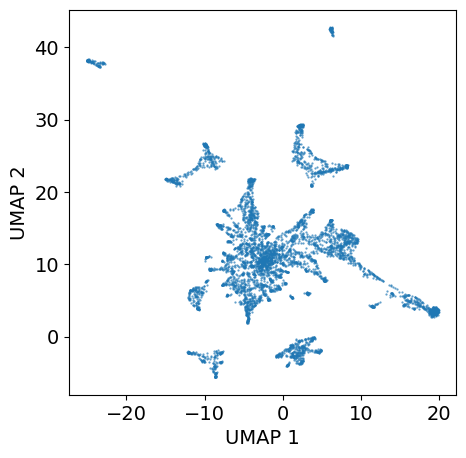

In [207]:
import umap

reducer = umap.UMAP(n_components=2, min_dist=0.5, n_neighbors=15)
embedding = reducer.fit_transform(cos_sim_activ)

df_umap_cos = pd.DataFrame(embedding, columns=['UMAP 1', 'UMAP 2'])
df_umap_cos['feature'] = active_features

# plot the UMAP

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', s=2, alpha=0.7, ec=None)
plt.show()

/tmp/ipykernel_1595248/3493817190.py:18: UserWarning: 
The palette list has fewer values (17) than needed (18) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)


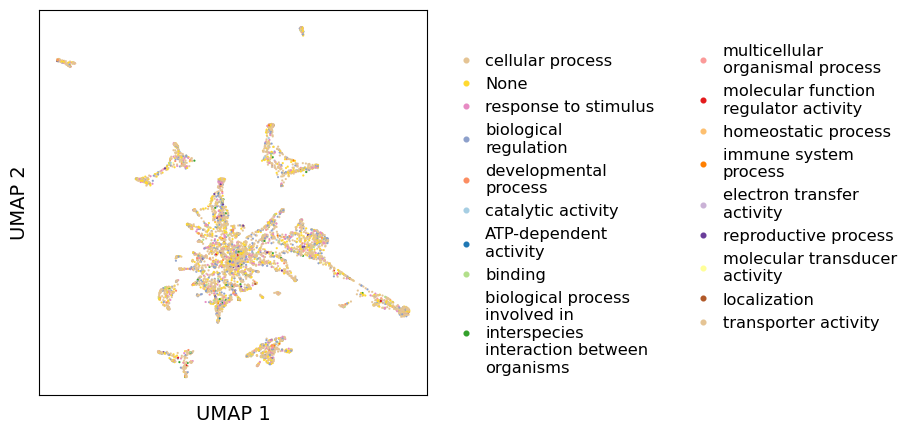

In [224]:
# set the legend font size to small
plt.rcParams.update({'legend.fontsize': 'small'})

# color each feature by its most prevalent level 1 go term
level_1_mtrx_terms = []

for feat in active_features:
    feat = feat
    try:
        temp_go_term = go_df[go_df['feature'] == feat]['parent_go_name_level1'].value_counts().index[0]
    except:
        temp_go_term = 'None'
    level_1_mtrx_terms.append(temp_go_term)

df_umap_cos['level_1_go_term'] = level_1_mtrx_terms

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', hue='level_1_go_term', s=2, alpha=1, ec=None, palette=level1_palette)
# if a legend handle is longer than 20 characters, break it up
handles, labels = ax.get_legend_handles_labels()
import textwrap
new_labels = [textwrap.fill(label, 20) for label in labels]
# also make the legend markers larger by scaling
ax.legend(handles, new_labels, loc='upper right', bbox_to_anchor=(2.25, 0.95), markerscale=3, frameon=False, handletextpad=0.2, ncol=2)
# remove ticks
ax.set_xticks([])
ax.set_yticks([])
plt.show()

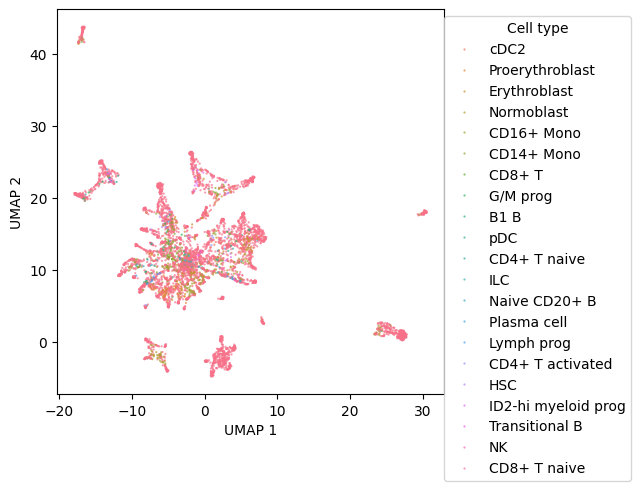

In [28]:
# now get the cell types from the local features

umap_ct = []

for feat in df_umap_cos['feature']:
    if feat in local_features:
        for ct in cell_types:
            if feat in unique_ct_features[ct]:
                umap_ct.append(ct)
                break
    else:
        umap_ct.append('')

df_umap_cos['celltype'] = umap_ct

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=df_umap_cos, x='UMAP 1', y='UMAP 2', hue='celltype', s=2, alpha=0.7, ec=None)
plt.legend(title='Cell type', loc='upper right', bbox_to_anchor=(1.5, 1))
plt.show()